# Introduction to Data Analysis through examples

## Setup and preliminaries

We start this notebook by typing a "magic" command that allows iPython notebooks to display plots directly in the browser.

In [4]:
# Render our plots inline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In order to read and process files, we are going to use a very powerful, and widely used Python library, called pandas. So, our next step is to import the pandas library in Python, and also import the library matplotlib for generating plots:

In [5]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

Pandas should already be installed on your machine, but if you get an error in the import statement above, indicating that pandas is not available, please uncomment the following command and execute:

In [3]:
# !sudo python3 -m pip install -U pandas

And we type some code to simply change the visual style of the plots. (The code below is optional and not necessary, and for now you do not need to understand what exactly is happening.)

In [6]:
# Make the graphs a bit bigger
matplotlib.style.use(['seaborn-talk', 'seaborn-ticks', 'seaborn-whitegrid'])

## Basic Example: Creating a DataFrame from Scratch

This is an example of creating a dataframe by passing a list of dictionaries.

In [7]:
df = pd.DataFrame([ 
    {"First Name": "Michalis", "Last Name":" Vlachos"},
    {"First Name": "John", "Last Name":" Doe"},
    {"Last Name":"Trump"}
])


In [8]:
df

,First Name,Last Name
0,Michalis,Vlachos
1,John,Doe
2,NaN,Trump


## Analyzing Data in Files

In [ ]:
!pwd

We will use a dataset with restaurant inspection results in NYC which is stored at `/data/restaurants.csv`.

If you do not have it, then uncomment below the lines that start with ! and execute the following:

In [ ]:
# Creates a folder "data" under the current folder
!mkdir -p data
# Removes any prior file if it exists
!rm -f data/restaurant.csv
# Fetches the most recent dataset and stores it under the folder data
!curl 'https://data.cityofnewyork.us/api/views/43nn-pn8j/rows.csv?accessType=DOWNLOAD' -o data/restaurant.csv
# Compresses the text file, both for saving space and for loading faster
!gzip data/restaurant.csv
# Take a look at the first 3 lines of the file, to ensure that everything worked fine
# !gzip -cd data/restaurant.csv.gz | head -3

### Reading a CSV file

We want to be able to read and process this file within Python. The pandas library has a very convenient method `read_csv` which reads the file, and returns back a variable that contains its contents.

In [9]:
import pandas as pd
restaurants = pd.read_csv("data/restaurant.csv.gz", 
                          encoding='utf_8', 
                          dtype = 'unicode',
                          parse_dates = True,
                          infer_datetime_format = True,
                          low_memory=False)

When you read a CSV, you get back a kind of object called a DataFrame, which is made up of rows and columns. You get columns out of a DataFrame the same way you get elements out of a dictionary. Let's take a look at how the object looks like:

In [10]:
restaurants.head(5)

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,RECORD DATE,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
0,50060315,WEI WILLIAMSBURGH,Brooklyn,145,BORINQUEN PL,11211,7183601908,Chinese,06/21/2018,Violations were cited in the following area(s).,...,09/08/2019,Smoke-Free Air Act / Initial Inspection,40.710654735966,-73.954179798304,301,34,051300,3063036,3024110017,BK73
1,41709961,FAIRFIELD INN,Manhattan,21,WEST 37 STREET,10018,2127306660,American,04/30/2019,Violations were cited in the following area(s).,...,09/08/2019,Cycle Inspection / Initial Inspection,40.75073910706,-73.984112229049,105,04,008400,1088538,1008390027,MN17
2,50062852,LILLY'S CRAFT AND KITCHEN,Manhattan,675B,9TH AVE,10036,2127570373,American,08/22/2018,Violations were cited in the following area(s).,...,09/08/2019,Cycle Inspection / Initial Inspection,40.761351054632,-73.990509852302,104,03,012700,NaN,1,MN15
3,50075719,LA IGUANA AZUL RESTAURANT,Staten Island,8,GIFFORDS LN,10308,7189484719,Mexican,04/01/2019,Violations were cited in the following area(s).,...,09/08/2019,Cycle Inspection / Initial Inspection,40.550975345285,-74.150257811809,503,51,014604,5107694,5054280032,SI54
4,41688805,SALUTE KOSHER RESTAURANT,Queens,6361,108 STREET,11375,7182756860,Jewish/Kosher,08/20/2018,Violations were cited in the following area(s).,...,09/08/2019,Cycle Inspection / Initial Inspection,40.733404809892,-73.849834389657,406,29,074300,4051602,4021690001,QN17


The read_csv method has many options, and you can read further in the [online documentation](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.io.parsers.read_csv.html).

### Descriptive statistics

We can use the method "describe()" to get a quick overview of the data in the dataframe.

In [11]:
restaurants.describe()

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,RECORD DATE,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
count,390235,389710,390235,389997,390234,384702,390224,390235,390235,388989,...,390235,388989,389834,389834,384302,384302,384302,382665,389834,384302
unique,26856,21081,6,7284,3241,225,25293,84,1304,5,...,1,32,22492,22492,69,51,1185,19575,19289,193
top,41187577,DUNKIN',Manhattan,1,BROADWAY,10003,7185958100,American,01/01/1900,Violations were cited in the following area(s).,...,09/08/2019,Cycle Inspection / Initial Inspection,0,0,105,03,003800,4000000,1,MN17
freq,84,4042,153573,2181,14134,10250,274,82719,1246,364923,...,390235,225677,5532,5532,31358,34444,3178,2460,3021,23258


We can also check the data types for each column

In [12]:
restaurants.dtypes

CAMIS                    object
DBA                      object
BORO                     object
BUILDING                 object
STREET                   object
ZIPCODE                  object
PHONE                    object
CUISINE DESCRIPTION      object
INSPECTION DATE          object
ACTION                   object
VIOLATION CODE           object
VIOLATION DESCRIPTION    object
CRITICAL FLAG            object
SCORE                    object
GRADE                    object
GRADE DATE               object
RECORD DATE              object
INSPECTION TYPE          object
Latitude                 object
Longitude                object
Community Board          object
Council District         object
Census Tract             object
BIN                      object
BBL                      object
NTA                      object
dtype: object

The `object` type is a string. For many of these, we would like to change the data types for a few columns, using the `pd.to_numeric` and `pd.to_datetime` functions. We examine how to convert data types below.

### Descriptive Statistics for Numeric Variables


#### Converting Data Types to Numeric

The `object` type is a string. When we want to convert an object to numeric, we can use the `pd.to_numeric` function, as shown below:

In [13]:
restaurants[["SCORE"]].head()

,SCORE
0,NaN
1,12
2,19
3,10
4,49


In [14]:
restaurants["SCORE"] = pd.to_numeric(restaurants["SCORE"])
restaurants.dtypes

CAMIS                     object
DBA                       object
BORO                      object
BUILDING                  object
STREET                    object
ZIPCODE                   object
PHONE                     object
CUISINE DESCRIPTION       object
INSPECTION DATE           object
ACTION                    object
VIOLATION CODE            object
VIOLATION DESCRIPTION     object
CRITICAL FLAG             object
SCORE                    float64
GRADE                     object
GRADE DATE                object
RECORD DATE               object
INSPECTION TYPE           object
Latitude                  object
Longitude                 object
Community Board           object
Council District          object
Census Tract              object
BIN                       object
BBL                       object
NTA                       object
dtype: object

#### Basic descriptive statistics for numeric variables

And now that SCORE is a numeric variable, we can get more detailed descriptive statistics for the variable using the `.describe()` command:

In [15]:
restaurants.SCORE.describe()

count    373207.000000
mean         20.268797
std          14.770477
min          -1.000000
25%          11.000000
50%          15.000000
75%          26.000000
max         166.000000
Name: SCORE, dtype: float64

And now that SCORE is a numeric variable, we can examine its distribution by using the `hist` command of Pandas, which creates a histogram. (The histogram is lso available as `plot.hist`, or `plot(kind='hist'))`.)

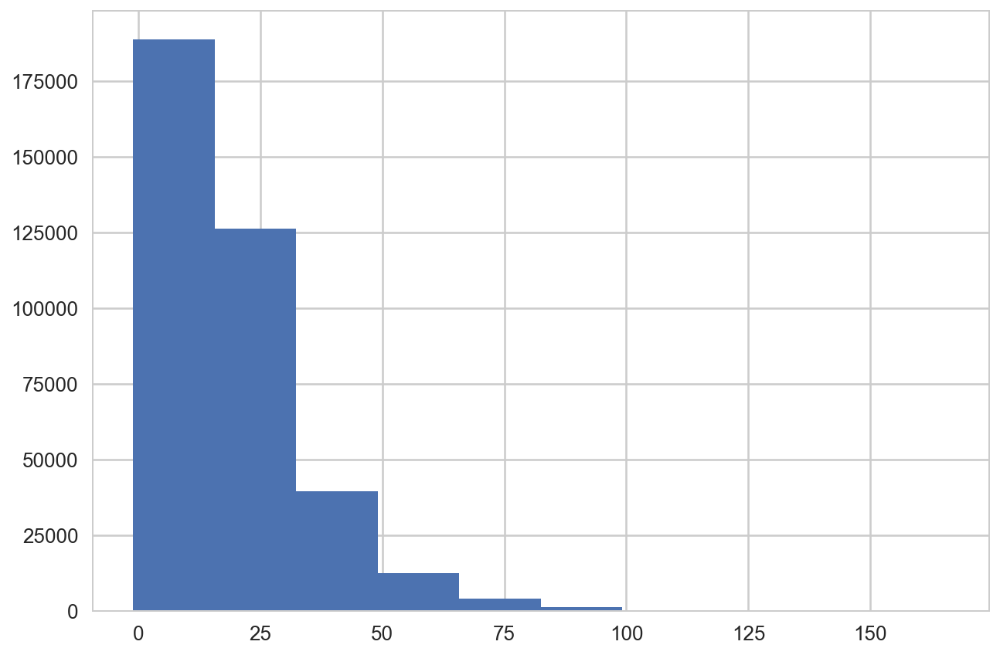

In [16]:
restaurants["SCORE"].hist()

By default, the histogram has ~10 bars in out plot. We can change the resolution of the histogram using the `bins` variable. Larger number of `bins` allow for higher resolution, but if we increase the number too much, many bins end up having very few, or no data points. For example, experiment with changing the balue of bins below, and change the value from 50 to something bigger.

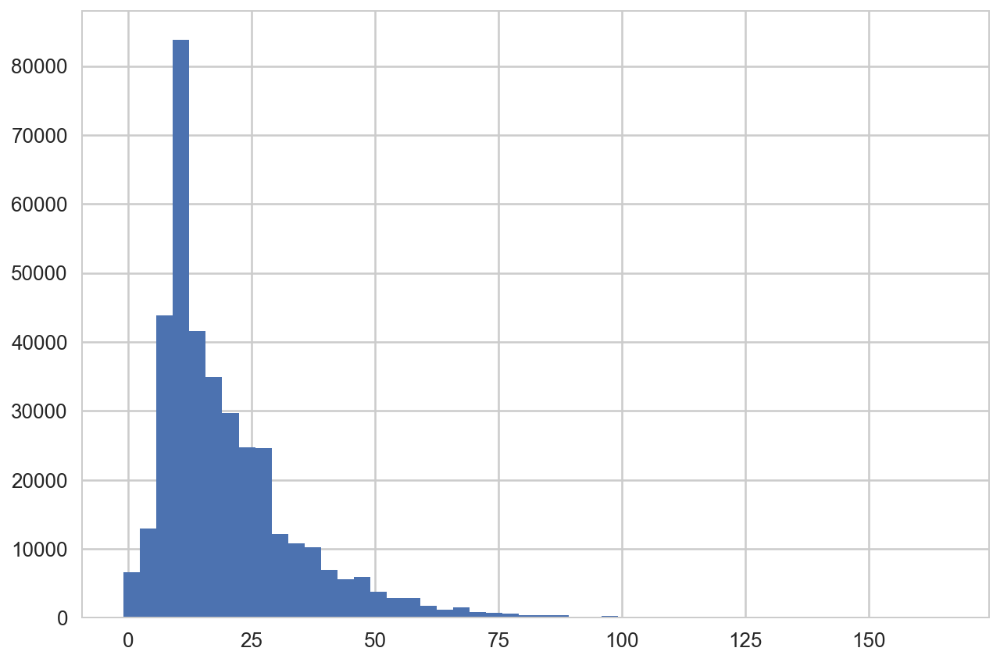

In [17]:
restaurants["SCORE"].hist(bins=50)

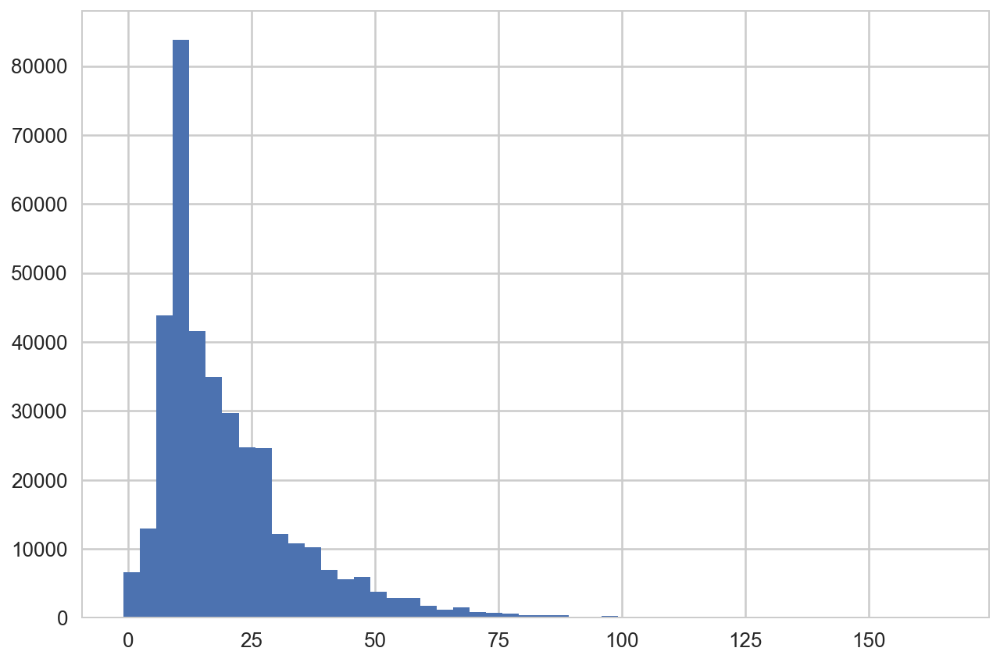

In [47]:
# For column names without a space, we can also access directly the column as follows:
restaurants.SCORE.hist(bins=50)

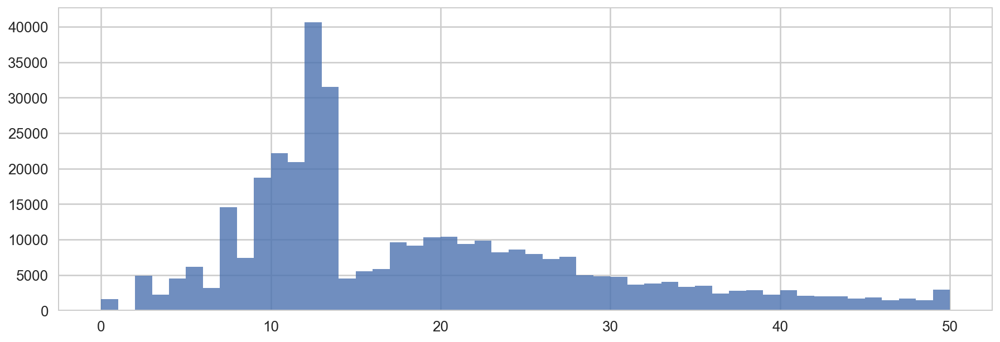

In [48]:
# A quick exposure to various options of the "hist" command 
restaurants.SCORE.hist(bins=50, # use 50 bars
                          range=(0,50), # x-axis from 0 to 50
                          density=False,  # show normalized count (density=True), or raw counts (density= False)
                          figsize=(15,5), # controls the size of the plot
                          alpha = 0.8 # make the plot 20% transparent
                         )

#### Kernel Density Estimation (KDE)

An alternative to histograms is to use the **kernel density**, which estimates a continuous function, instead of the bucketized counts, which tends to be discontunuous and bumpy. We can access this usind the `.plot(kind='kde')` command:

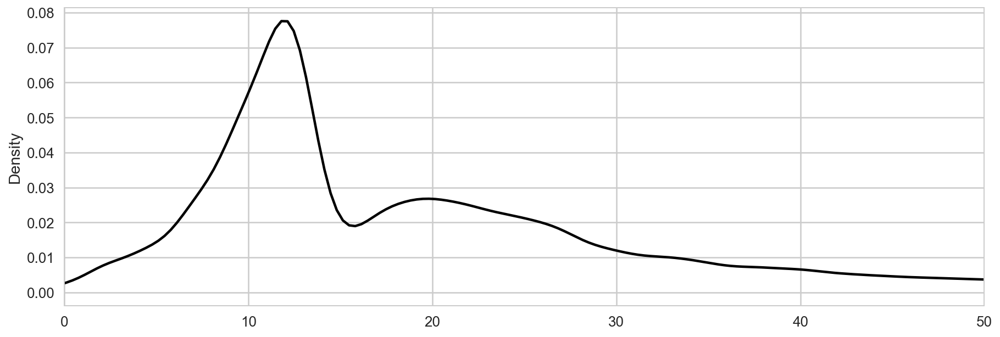

In [49]:
# This plots the density of a numeric attribute
# kde = kernel density estimation
restaurants.SCORE.plot(
    kind='kde', 
    color='Black', 
    xlim=(0,50), 
    figsize=(15,5)
)

### Converting Dates

Now let's convert the dates columns into the appropriate data types. Let's take a look at a few dates.

In [50]:
restaurants["GRADE DATE"].head(10)

0           NaN
1    04/30/2019
2           NaN
3    04/01/2019
4           NaN
5    10/25/2017
6           NaN
7    09/04/2019
8           NaN
9    08/13/2019
Name: GRADE DATE, dtype: object

For that, we need to understand first how to [parse dates using the Python conventions](https://docs.python.org/3/library/datetime.html#strftime-and-strptime-behavior).

The relevant entries from the table are:
* `%m` Month as a zero-padded decimal number.
* `%d` 	Day of the month as a zero-padded decimal number.
* `%Y` Year with century as a decimal number.

Now, we can specify how to parse these dates. (In principle, we can let Pandas do this automatically, but it is _much_ faster if we specify it ourselves. It is also much less error-prone.)

In [51]:
restaurants["GRADE DATE"] = pd.to_datetime(restaurants["GRADE DATE"], format="%m/%d/%Y")
restaurants["RECORD DATE"] = pd.to_datetime(restaurants["RECORD DATE"], format="%m/%d/%Y")
restaurants["INSPECTION DATE"] = pd.to_datetime(restaurants["INSPECTION DATE"], format="%m/%d/%Y")

In [52]:
restaurants.dtypes

CAMIS                            object
DBA                              object
BORO                             object
BUILDING                         object
STREET                           object
ZIPCODE                          object
PHONE                            object
CUISINE DESCRIPTION              object
INSPECTION DATE          datetime64[ns]
ACTION                           object
VIOLATION CODE                   object
VIOLATION DESCRIPTION            object
CRITICAL FLAG                    object
SCORE                           float64
GRADE                            object
GRADE DATE               datetime64[ns]
RECORD DATE              datetime64[ns]
INSPECTION TYPE                  object
Latitude                         object
Longitude                        object
Community Board                  object
Council District                 object
Census Tract                     object
BIN                              object
BBL                              object


In [53]:
restaurants[["INSPECTION DATE", "GRADE DATE", "RECORD DATE"]].describe()

,INSPECTION DATE,GRADE DATE,RECORD DATE
count,390235,196201,390235
unique,1304,1234,1
top,1900-01-01 00:00:00,2019-06-13 00:00:00,2019-09-08 00:00:00
freq,1246,536,390235
first,1900-01-01 00:00:00,2013-06-07 00:00:00,2019-09-08 00:00:00
last,2019-09-06 00:00:00,2019-09-06 00:00:00,2019-09-08 00:00:00


#### Exercise

* Plot a histogram for `INSPECTION DATE`, `GRADE DATE`, `RECORD DATE`. What do you see?
* Try modifying the `bins` parameter. What are the results?
* The `range=(start, finish)` command is often useful, when we want to focus on a particular part of the dataset. Try using that for  `INSPECTION DATE` to limit the dates to be between 1/1/2014 and 05/31/2018.

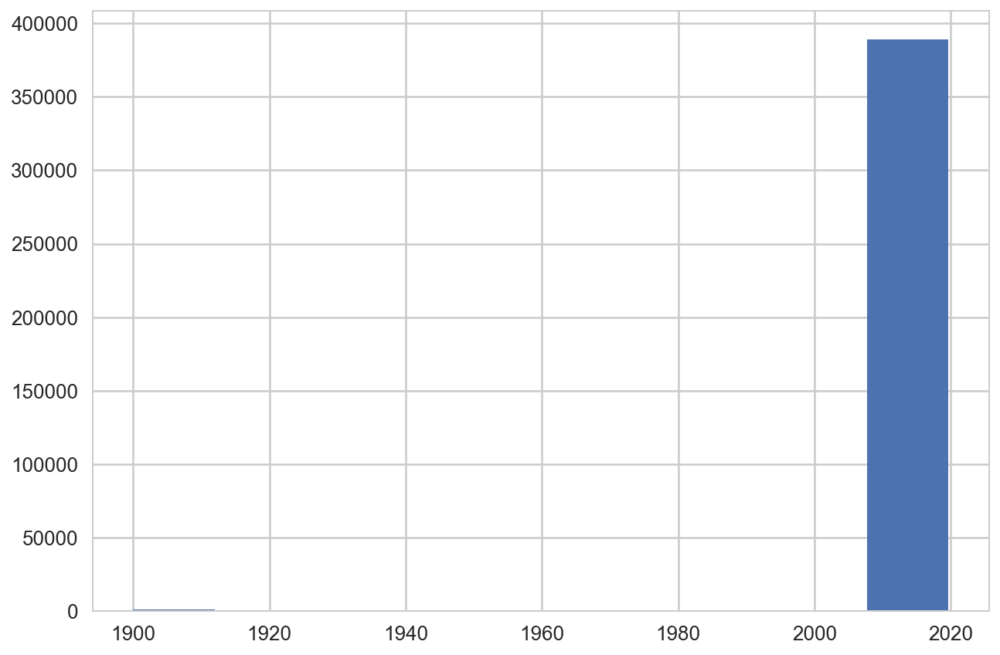

In [54]:
# Not very appealing
restaurants['INSPECTION DATE'].hist()

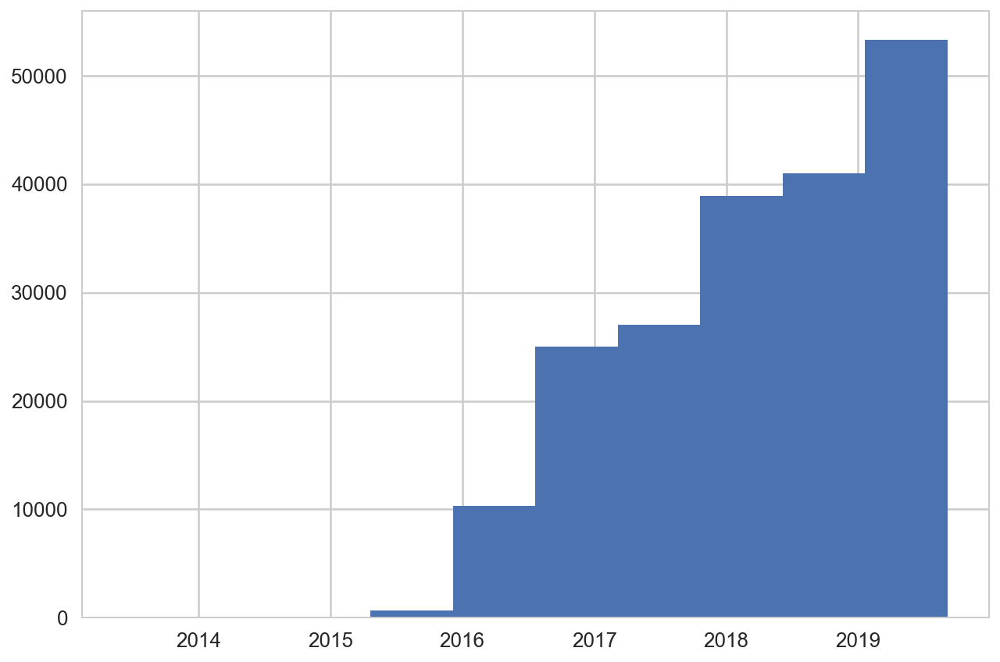

In [55]:
restaurants['GRADE DATE'].hist()

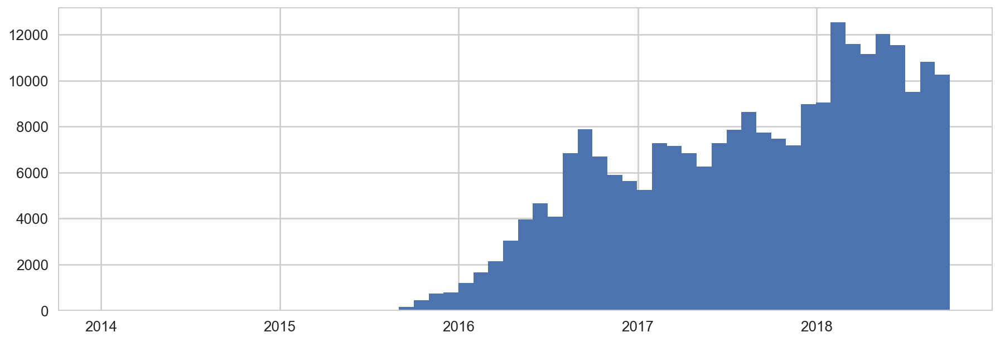

In [56]:
restaurants['INSPECTION DATE'].hist(
    range = ('1/1/2014','9/30/2018'), # limit the range of dates, ignore the 1/1/1990 faulty valye
    bins = 57, # number of months in the range -- computed manually
    figsize = (15,5) # resize 15-width, 5-height
)

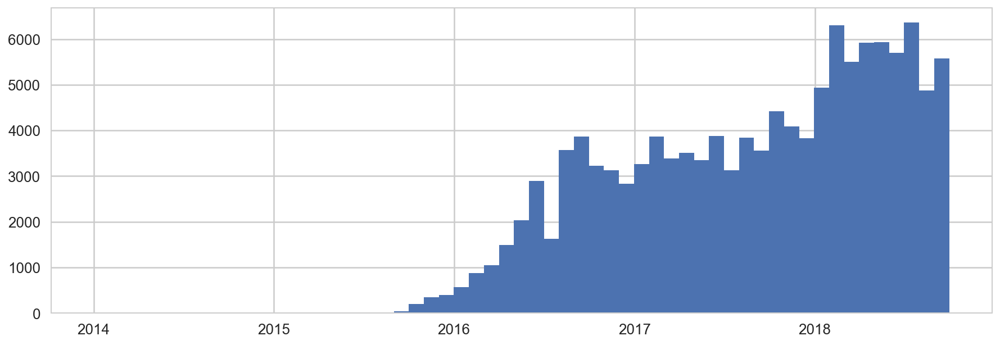

In [57]:
restaurants['GRADE DATE'].hist(
    range = ('1/1/2014','9/30/2018'), # limit the range of dates, ignore the 1/1/1990 faulty valye
    bins = 57, # number of months in the range -- computed manually
    figsize = (15,5) # resize 15-width, 5-height
)

### Categorical Variables

This is less important, but sometimes we want to specify variables to be "Categorical". This is most commonly useful when we have variables that have an implicit order (e.g., the A/B/C grade of the restaurant).

In [58]:
restaurants["BORO"] =  pd.Categorical(restaurants["BORO"], ordered=False)
restaurants["GRADE"] =  pd.Categorical(restaurants["GRADE"], categories = ['A', 'B', 'C'], ordered=True)
restaurants["VIOLATION CODE"] =  pd.Categorical(restaurants["VIOLATION CODE"], ordered=False)
restaurants["CRITICAL FLAG"] =  pd.Categorical(restaurants["CRITICAL FLAG"], ordered=False)
restaurants["ACTION"] =  pd.Categorical(restaurants["ACTION"], ordered=False)
restaurants["CUISINE DESCRIPTION"] =  pd.Categorical(restaurants["CUISINE DESCRIPTION"], ordered=False)
restaurants.dtypes

CAMIS                            object
DBA                              object
BORO                           category
BUILDING                         object
STREET                           object
ZIPCODE                          object
PHONE                            object
CUISINE DESCRIPTION            category
INSPECTION DATE          datetime64[ns]
ACTION                         category
VIOLATION CODE                 category
VIOLATION DESCRIPTION            object
CRITICAL FLAG                  category
SCORE                           float64
GRADE                          category
GRADE DATE               datetime64[ns]
RECORD DATE              datetime64[ns]
INSPECTION TYPE                  object
Latitude                         object
Longitude                        object
Community Board                  object
Council District                 object
Census Tract                     object
BIN                              object
BBL                              object


### Analyzing the content of the columns

We can also get quick statistics about the common values that appear in each column:

In [59]:
restaurants["DBA"].value_counts()[:10] 

DUNKIN'                    4042
SUBWAY                     2837
STARBUCKS                  2107
MCDONALD'S                 1998
KENNEDY FRIED CHICKEN      1249
DUNKIN', BASKIN ROBBINS    1154
CROWN FRIED CHICKEN        1053
BURGER KING                 983
POPEYES                     963
DOMINO'S                    939
Name: DBA, dtype: int64

In [60]:
restaurants["CUISINE DESCRIPTION"].value_counts()[:5]

American                                                            82719
Chinese                                                             40993
Café/Coffee/Tea                                                     18726
Pizza                                                               17426
Latin (Cuban, Dominican, Puerto Rican, South & Central American)    16951
Name: CUISINE DESCRIPTION, dtype: int64

And we can use the "plot" command to plot the resulting histogram. (More details at http://pandas.pydata.org/pandas-docs/stable/visualization.html) We also revisit plotting below.

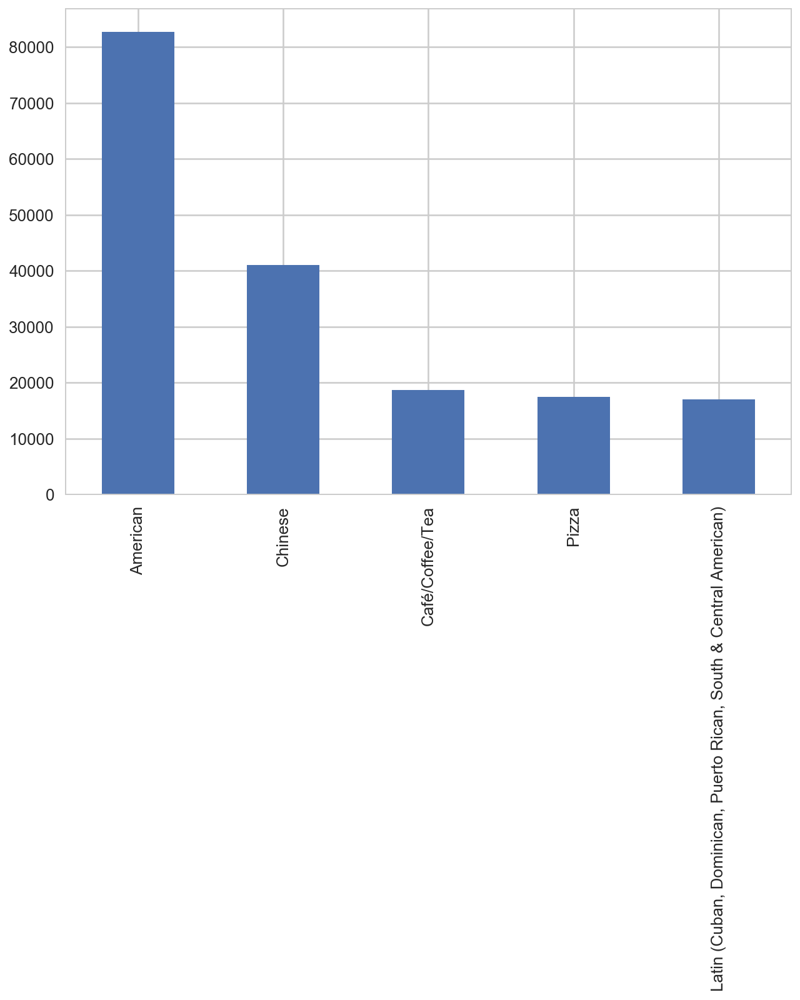

In [61]:
restaurants["CUISINE DESCRIPTION"].value_counts()[:5].plot(kind='bar')

In [62]:
popular = restaurants["CUISINE DESCRIPTION"].value_counts()
popular

American                                                            82719
Chinese                                                             40993
Café/Coffee/Tea                                                     18726
Pizza                                                               17426
Latin (Cuban, Dominican, Puerto Rican, South & Central American)    16951
Italian                                                             15754
Mexican                                                             15577
Caribbean                                                           14034
Japanese                                                            13896
Bakery                                                              12245
Spanish                                                             12237
Pizza/Italian                                                        8358
Chicken                                                              7207
Indian                                

Hm, that does not look nice. Let's shorten the name of the cuisine for the _"Latin (Cuban, Dominican, Puerto Rican, South & Central American)"_ and replace it with _"Latin American"_. We will use the `replace` command in Pandas:

In [63]:
restaurants["CUISINE DESCRIPTION"].replace(
    to_replace='Latin (Cuban, Dominican, Puerto Rican, South & Central American)',
    value = 'Latin American',
    inplace=True
)

In [64]:
restaurants["CUISINE DESCRIPTION"].replace(
    to_replace='CafÃ©/Coffee/Tea',
    value = 'Cafe/Coffee/Tea',
    inplace=True
)


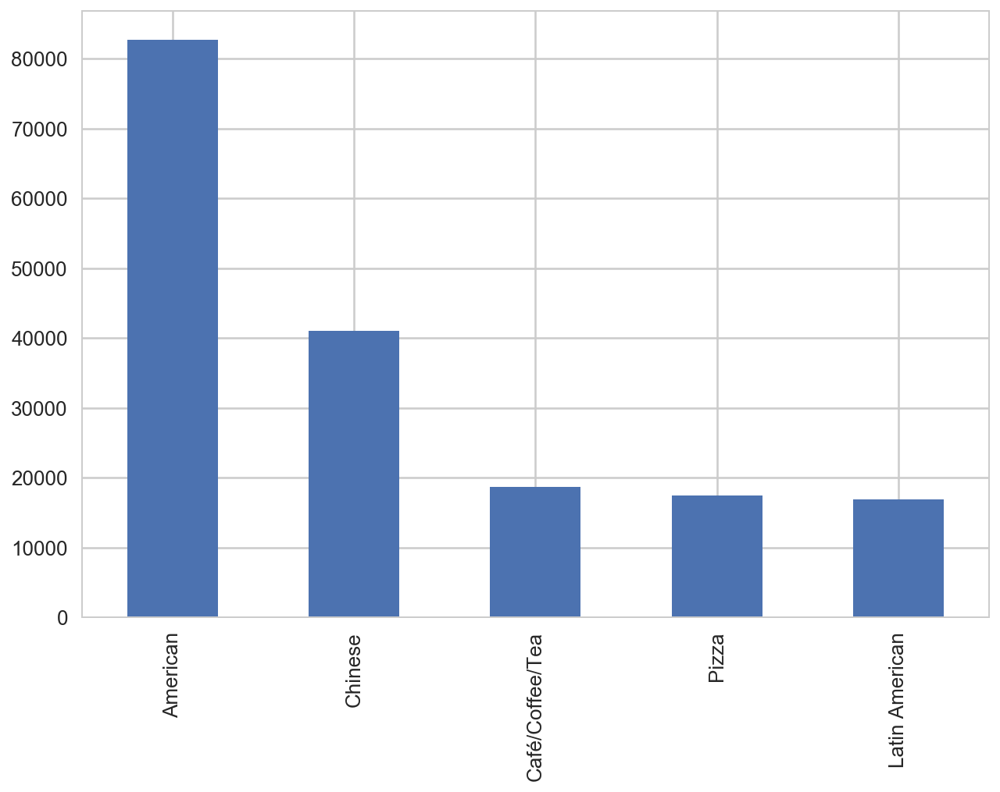

In [65]:
popular = restaurants["CUISINE DESCRIPTION"].value_counts()
popular[:5].plot(kind='bar')

In [66]:
restaurants["VIOLATION CODE"].head(5)

0    15F7
1     10F
2     06D
3     06D
4     04H
Name: VIOLATION CODE, dtype: category
Categories (106, object): [02A, 02B, 02C, 02D, ..., 22C, 22E, 22F, 22G]

In [67]:
violation_counts = restaurants["VIOLATION CODE"].value_counts();
violation_counts[0:10]

10F    55051
08A    42657
04L    28743
06D    26795
06C    24492
10B    23368
02G    23002
04N    20238
02B    20014
04H     8384
Name: VIOLATION CODE, dtype: int64

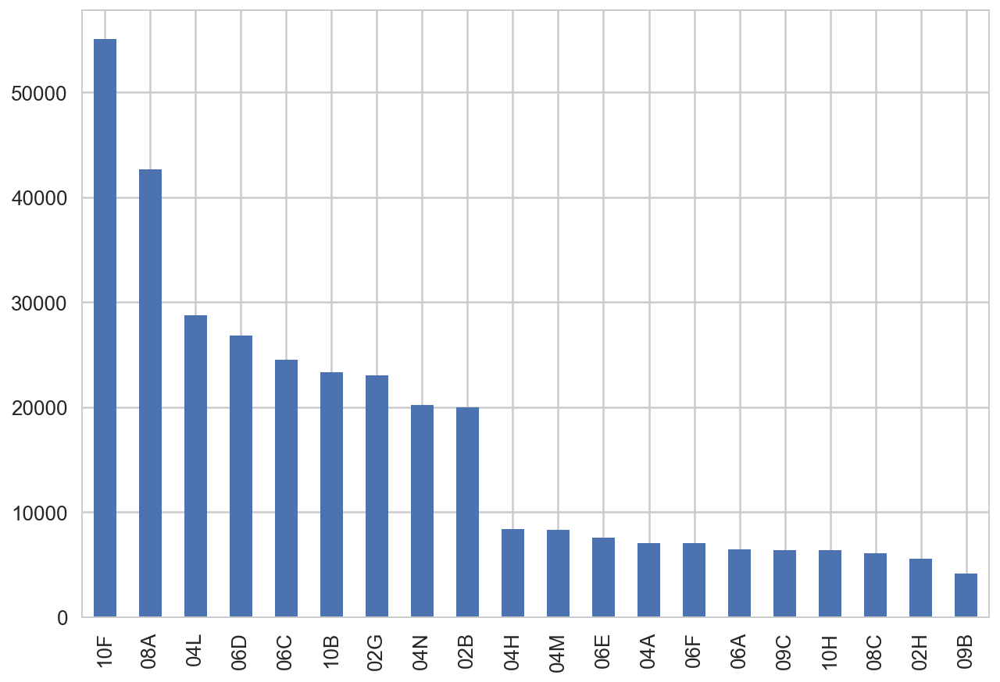

In [68]:
violation_counts[0:20].plot(kind='bar')

#### Exercise

* Create a plot showing the number of inspections that happen across **boroughs**. Use the `BORO` column and the `value_counts()` function.

In [69]:
restaurants['BORO'].value_counts()

Manhattan        153573
Brooklyn          98961
Queens            89272
Bronx             35288
Staten Island     13039
0                   102
Name: BORO, dtype: int64

In [70]:
# Same as above; works only for attribute names without spaces
restaurants.BORO.value_counts()

Manhattan        153573
Brooklyn          98961
Queens            89272
Bronx             35288
Staten Island     13039
0                   102
Name: BORO, dtype: int64

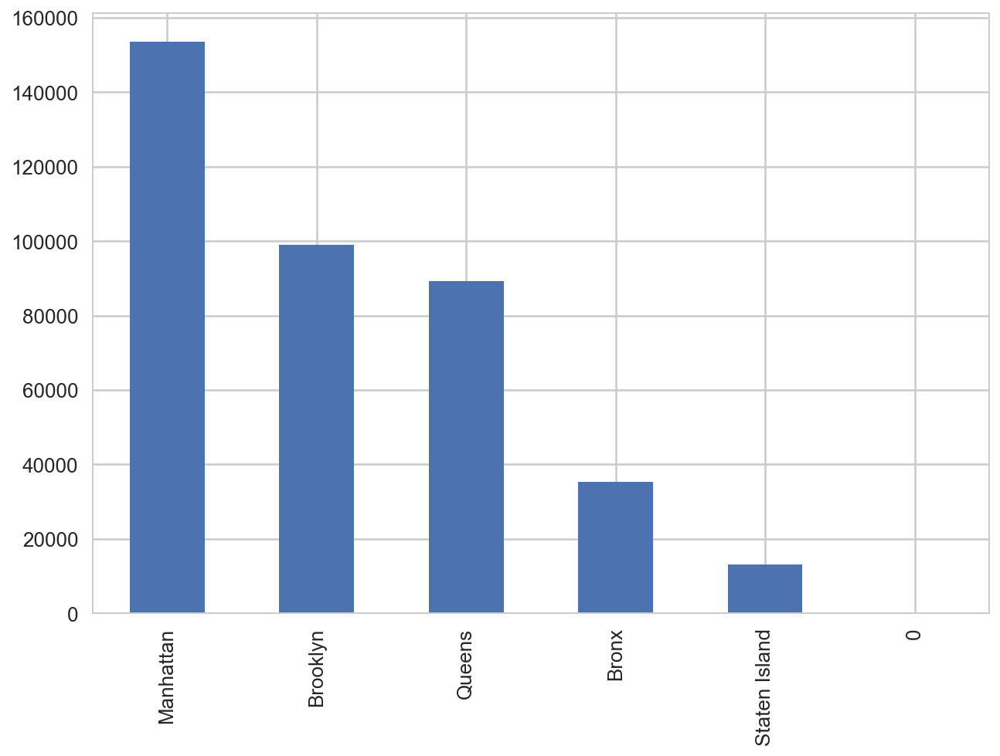

In [71]:
restaurants['BORO'].value_counts().plot(kind='bar')

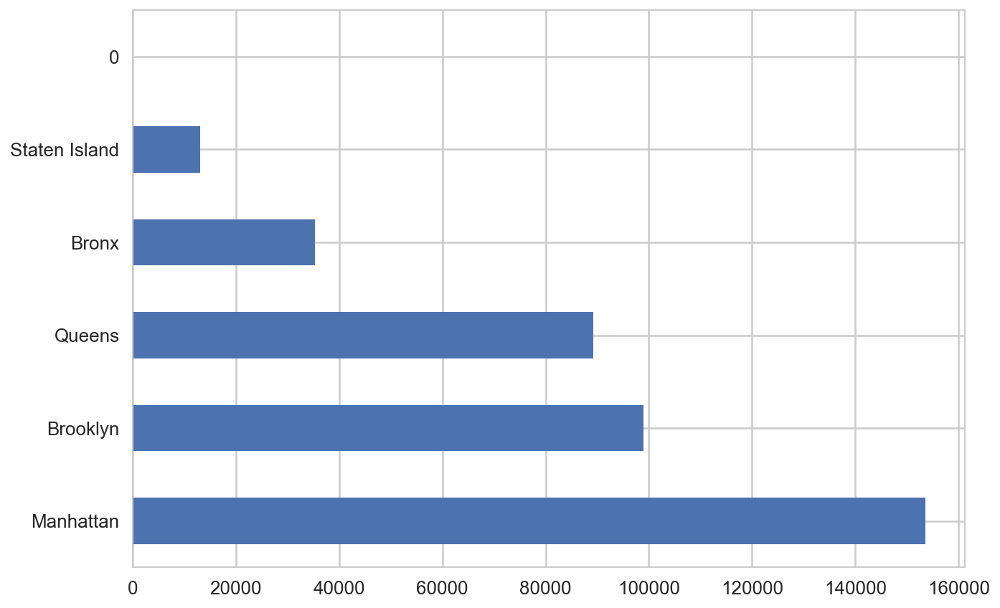

In [72]:
restaurants['BORO'].value_counts().plot(kind='barh')

### Selecting a subset of the columns

In a dataframe, we can specify the column(s) that we want to keep, and get back another dataframe with just the subset of the columns that we want to keep.

In [73]:
restaurants[ ["DBA", "GRADE", "GRADE DATE"] ]

,DBA,GRADE,GRADE DATE
0,WEI WILLIAMSBURGH,NaN,NaT
1,FAIRFIELD INN,A,2019-04-30
2,LILLY'S CRAFT AND KITCHEN,NaN,NaT
3,LA IGUANA AZUL RESTAURANT,A,2019-04-01
4,SALUTE KOSHER RESTAURANT,NaN,NaT
5,MAMAJUANA CAFE,B,2017-10-25
6,BOCELLI'S,NaN,NaT
7,CARACAS BEACH CAFE,A,2019-09-04
8,GUESTHOUSE RESTAURANT,NaN,NaT
9,OM INDIAN RESTAURANT,NaN,2019-08-13


In [74]:
columns = ["GRADE DATE","VIOLATION CODE", "DBA", "SCORE"]
restaurants[ columns ].head(10)

,GRADE DATE,VIOLATION CODE,DBA,SCORE
0,NaT,15F7,WEI WILLIAMSBURGH,NaN
1,2019-04-30,10F,FAIRFIELD INN,12.0
2,NaT,06D,LILLY'S CRAFT AND KITCHEN,19.0
3,2019-04-01,06D,LA IGUANA AZUL RESTAURANT,10.0
4,NaT,04H,SALUTE KOSHER RESTAURANT,49.0
5,2017-10-25,04L,MAMAJUANA CAFE,16.0
6,NaT,09B,BOCELLI'S,68.0
7,2019-09-04,04N,CARACAS BEACH CAFE,13.0
8,NaT,04L,GUESTHOUSE RESTAURANT,47.0
9,2019-08-13,10F,OM INDIAN RESTAURANT,35.0


In [75]:
restaurants[ ["GRADE DATE","VIOLATION CODE", "DBA", "SCORE"] ].head(10)

,GRADE DATE,VIOLATION CODE,DBA,SCORE
0,NaT,15F7,WEI WILLIAMSBURGH,NaN
1,2019-04-30,10F,FAIRFIELD INN,12.0
2,NaT,06D,LILLY'S CRAFT AND KITCHEN,19.0
3,2019-04-01,06D,LA IGUANA AZUL RESTAURANT,10.0
4,NaT,04H,SALUTE KOSHER RESTAURANT,49.0
5,2017-10-25,04L,MAMAJUANA CAFE,16.0
6,NaT,09B,BOCELLI'S,68.0
7,2019-09-04,04N,CARACAS BEACH CAFE,13.0
8,NaT,04L,GUESTHOUSE RESTAURANT,47.0
9,2019-08-13,10F,OM INDIAN RESTAURANT,35.0


### Selecting rows

To select rows, we can use the following approach, where we generate a list of boolean values, one for each row of the dataframe, and then we use the list to select which of the rows of the dataframe we want to keep"

In [76]:
# Create the condition "has mice" for code 04L
mice = (restaurants["VIOLATION CODE"] == "04L")
mice

0         False
1         False
2         False
3         False
4         False
5          True
6         False
7         False
8          True
9         False
10        False
11        False
12        False
13        False
14        False
15        False
16        False
17         True
18        False
19        False
20        False
21        False
22        False
23        False
24        False
25        False
26        False
27        False
28         True
29         True
          ...  
390205    False
390206    False
390207    False
390208    False
390209    False
390210    False
390211    False
390212    False
390213    False
390214    False
390215    False
390216    False
390217    False
390218    False
390219    False
390220    False
390221    False
390222    False
390223    False
390224    False
390225    False
390226    False
390227    False
390228    False
390229    False
390230    False
390231    False
390232    False
390233    False
390234    False
Name: VIOLATION CODE, Le

In [77]:
# Apply the condition to the dataframe "restaurants" and store the result 
# in a dataframe called  has_mice
has_mice = restaurants[mice]
has_mice

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,RECORD DATE,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
5,41127243,MAMAJUANA CAFE,Manhattan,247,DYCKMAN STREET,10034,2123040140,Latin American,2017-10-25,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Re-inspection,40.866370405498,-73.928260915102,112,10,029500,1065062,1022470056,MN01
8,50044147,GUESTHOUSE RESTAURANT,Brooklyn,282,BRIGHTON BEACH AVE,11235,7188913111,Eastern European,2019-02-19,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Initial Inspection,40.576908016681,-73.964639292253,313,48,036001,3245053,3086850004,BK19
17,50046167,ROSARIO'S IHAWAN,Queens,4009,69TH ST,11377,7184583300,Filipino,2017-11-14,Establishment Closed by DOHMH. Violations wer...,...,2019-09-08,Cycle Inspection / Initial Inspection,40.745958578646,-73.89624247683,402,26,026300,4030346,4013010024,QN63
28,41299987,DUNKIN',Bronx,209,WEST 231 STREET,10463,7184322741,Donuts,2016-08-16,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Initial Inspection,40.879097412953,-73.905132297295,208,11,028900,2083161,2057040047,BX29
29,50080847,BAY SHISH KEBAB,Brooklyn,601,BRIGHTON BEACH AVE,11235,7189754455,Turkish,2018-10-11,Violations were cited in the following area(s).,...,2019-09-08,Pre-permit (Operational) / Initial Inspection,40.577639799215,-73.961312663352,313,48,036200,3244921,3086760014,BK19
38,50074125,SONG SONG FOOD,Queens,16220,NORTHERN BLVD,11358,7185511431,Korean,2019-01-14,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Initial Inspection,40.761679507444,-73.803200125148,407,20,117100,4120469,4053360021,QN51
78,50071397,Q & I BAKERY,Brooklyn,6516,11TH AVE,11219,7182382638,Bakery,2019-09-03,Establishment Closed by DOHMH. Violations wer...,...,2019-09-08,Cycle Inspection / Initial Inspection,40.628482363808,-74.006099166977,310,38,021200,3142182,3057510045,BK30
88,50047414,THE PICNIC BASKET,Manhattan,65,W 37TH ST,10018,2123822627,Sandwiches,2018-05-07,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Re-inspection,40.751167425664,-73.98512632289,105,04,008400,1080733,1008390001,MN17
90,41264019,POCO,Manhattan,33,AVENUE B,10009,2122284461,Spanish,2016-05-21,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Initial Inspection,40.7225118046,-73.983065541094,103,02,002202,1004589,1003850005,MN28
92,41672217,GREEN HOUSE RESTAURANT & PARTY HALL,Brooklyn,90,CHURCH AVENUE,11218,7188534030,Bangladeshi,2017-03-17,Establishment Closed by DOHMH. Violations wer...,...,2019-09-08,Cycle Inspection / Re-inspection,40.642616379865,-73.979832075167,312,39,048600,3125217,3053520088,BK41


In [78]:
restaurants["DBA"].value_counts()[:10]

DUNKIN'                    4042
SUBWAY                     2837
STARBUCKS                  2107
MCDONALD'S                 1998
KENNEDY FRIED CHICKEN      1249
DUNKIN', BASKIN ROBBINS    1154
CROWN FRIED CHICKEN        1053
BURGER KING                 983
POPEYES                     963
DOMINO'S                    939
Name: DBA, dtype: int64

In [79]:
# List the most frequent DBA values in the dataframe
has_mice["DBA"].value_counts()[:20]

SUBWAY                                   239
DUNKIN'                                  143
KENNEDY FRIED CHICKEN                    116
CROWN FRIED CHICKEN                      104
STARBUCKS                                 83
POPEYES                                   75
GOLDEN KRUST CARIBBEAN BAKERY & GRILL     74
MCDONALD'S                                64
DOMINO'S                                  62
BURGER KING                               59
DUNKIN', BASKIN ROBBINS                   58
KFC                                       37
LITTLE CAESARS                            36
LE PAIN QUOTIDIEN                         33
CARVEL ICE CREAM                          32
AMC THEATRES                              28
VIVI BUBBLE TEA                           26
EMPANADAS MONUMENTAL                      23
CHECKERS                                  22
IHOP                                      21
Name: DBA, dtype: int64

In [80]:
has_mice["CAMIS"].value_counts()[:5]

50016943    13
41259444    12
50004065    11
41407999    11
40423819    11
Name: CAMIS, dtype: int64

In [81]:
condition = (has_mice["CAMIS"] == '41259444')
has_mice[condition]

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,RECORD DATE,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
17998,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2018-12-17,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Initial Inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37
37598,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2017-10-30,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Initial Inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37
79155,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2018-06-08,Establishment re-opened by DOHMH,...,2019-09-08,Cycle Inspection / Reopening Inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37
90617,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2017-03-30,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Re-inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37
109792,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2017-12-19,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Re-inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37
156146,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2016-09-07,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Re-inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37
156944,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2019-02-11,Establishment Closed by DOHMH. Violations wer...,...,2019-09-08,Cycle Inspection / Re-inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37
189527,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2019-06-25,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Initial Inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37
234802,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2018-06-05,Establishment Closed by DOHMH. Violations wer...,...,2019-09-08,Cycle Inspection / Initial Inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37
286369,41259444,COCO ROCO RESTAURANT,Brooklyn,392,5 AVENUE,11215,7189653376,Peruvian,2018-07-25,Violations were cited in the following area(s).,...,2019-09-08,Cycle Inspection / Re-inspection,40.670737437043,-73.985007343144,306,39,013700,3021602,3009930037,BK37


And we can use more complex conditions. 

In [82]:
mice_manhattan =  ( (restaurants["VIOLATION CODE"] == "04L") 
                    & (restaurants["BORO"] == "MANHATTAN") 
                    & (restaurants["ZIPCODE"] == "10012") )

In [83]:
has_mice_10012 = restaurants[mice_manhattan]
has_mice_10012

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,RECORD DATE,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA


In [85]:
has_mice_10012["DBA"].value_counts()[:20]

Series([], Name: DBA, dtype: int64)

### Pivot Tables

[Pivot tables](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.pivot_table.html) is one of the most commonly used exploratory tools, and in Pandas they are extremely flexible. 

For example, let's try to count the number of restaurants that are inspected every day. 

In [87]:
pivot = pd.pivot_table(
    data = restaurants, 
    index = 'INSPECTION DATE', # specifies the rows
    values = 'CAMIS',  # specifies the content of the cells
    aggfunc = 'count' # we ask to count how many different CAMIS values we see
)

In [88]:
pivot

,CAMIS
INSPECTION DATE,
1900-01-01,1246
2013-06-07,1
2013-10-22,2
2014-03-06,1
2014-04-21,2
2014-09-13,4
2014-10-30,5
2015-01-05,2
2015-02-11,2


Now, let's plot this. By default, Pandas considers the "index" column to be the x-axis, and plots the rest.

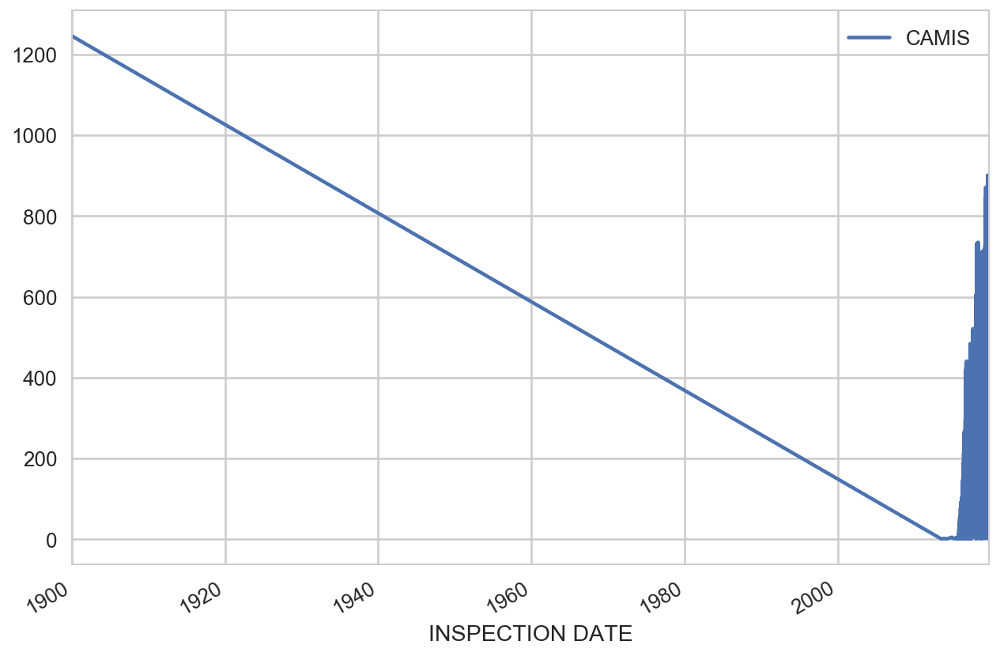

In [93]:
pivot.plot()

In [90]:
pivot.head(5)

,CAMIS
INSPECTION DATE,
1900-01-01,1246
2013-06-07,1
2013-10-22,2
2014-03-06,1
2014-04-21,2


#### Deleting rows from a DataFrame

Hm, that '1900-01-01' line is messing things up. Let's delete it, using the `drop` command. Notice a few things:
* We use the `pd.to_datetime` command to convert the '1900-01-01' string into a datetime data type.
* We use the `axis='index'` parameter means that we delete a **row** with that index value. (The `axis='columns'` means that we delete a column.). Often you will see `axis=0` (equivalent to `axis='index'`) and `axis=1` (equivalent to `axis='columns'`).
* The `inplace=True` means that we change directly the dataframe, instead of returning a new dataframe that does not have the deleted value.

In [94]:
pivot.drop(pd.to_datetime('1900-01-01'), axis='index', inplace=True) 

In [95]:
pivot.head(5)

,CAMIS
INSPECTION DATE,
2013-06-07,1
2013-10-22,2
2014-03-06,1
2014-04-21,2
2014-09-13,4


And let's plot again.

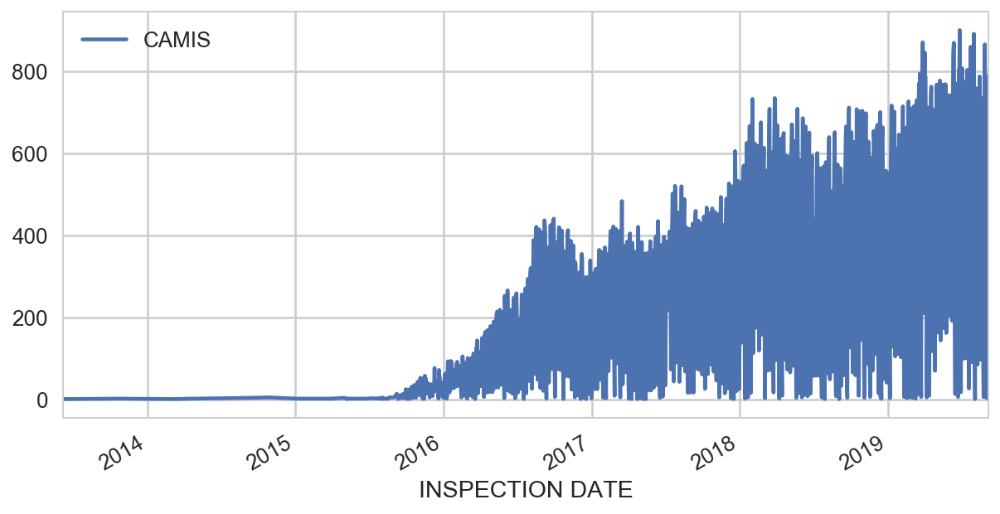

In [96]:
pivot.plot(figsize=(10,5))

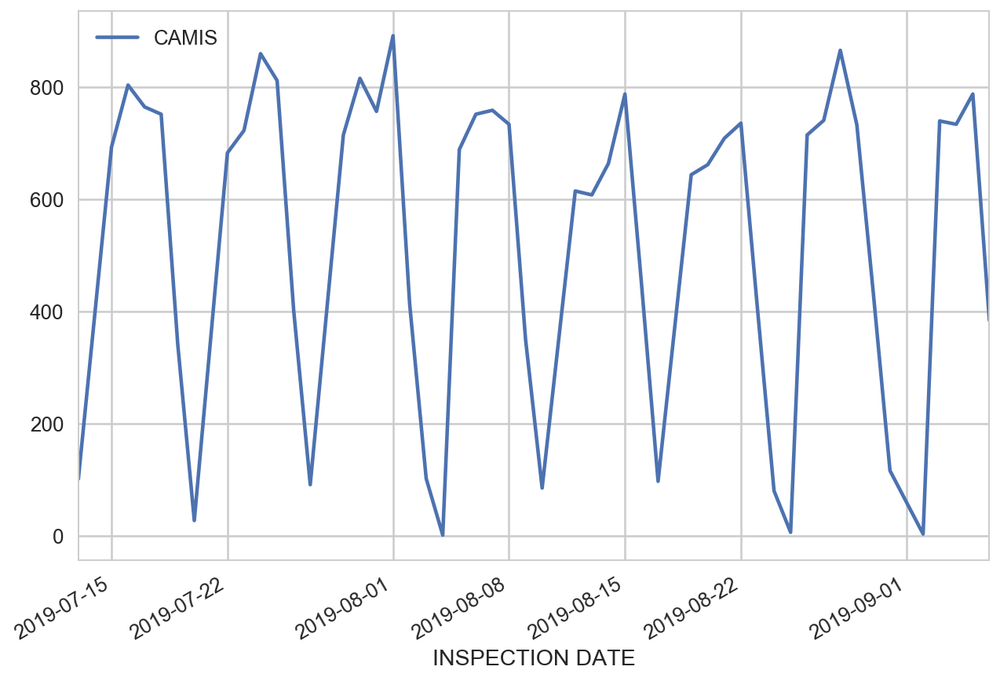

In [97]:
pivot.tail(50).plot()

#### Changing date granularity 

We can also use the [resample](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.resample.html) command to change the frequency from one day, to, say, 7 days. Then we can compute, say, the average (`mean()`) for these days, or the total number (`sum()`) of inspections.

In [98]:
pivot.resample('1W').mean().tail(10)

,CAMIS
INSPECTION DATE,
2019-07-07,529.000000
2019-07-14,515.333333
2019-07-21,563.833333
2019-07-28,595.166667
2019-08-04,528.142857
2019-08-11,561.500000
2019-08-18,536.833333
2019-08-25,463.142857
2019-09-01,600.333333


Now, let's plot this. By default, Pandas considers the "index" column to be the x-axis, and plots the rest.

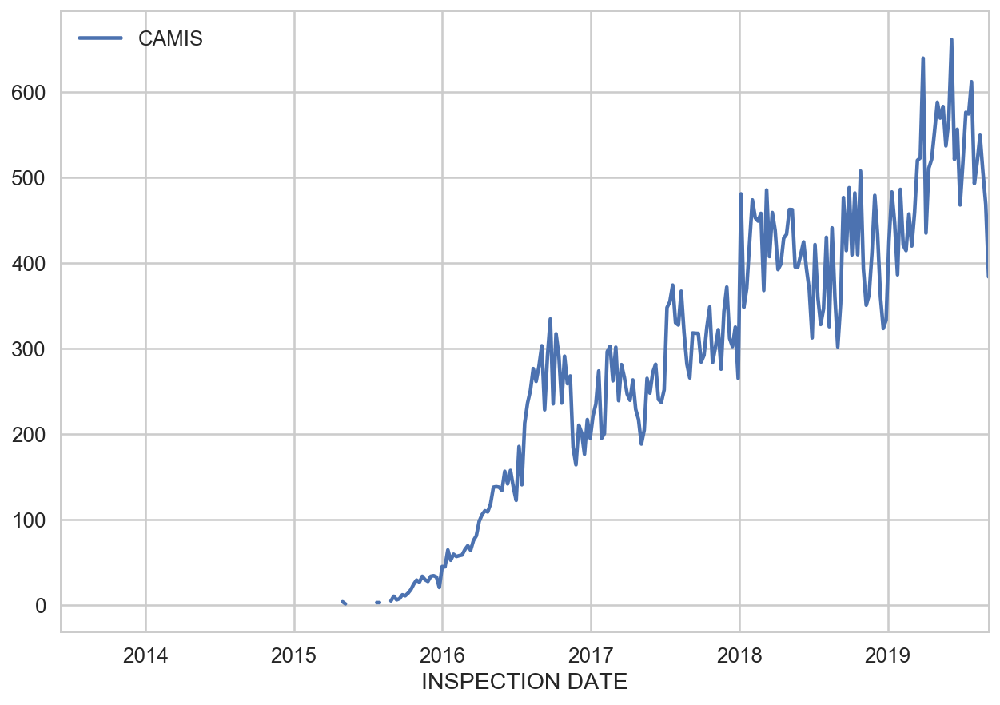

In [99]:
# Plot the average number of inspections, over 7-day periods
pivot.resample('7D').mean().plot()

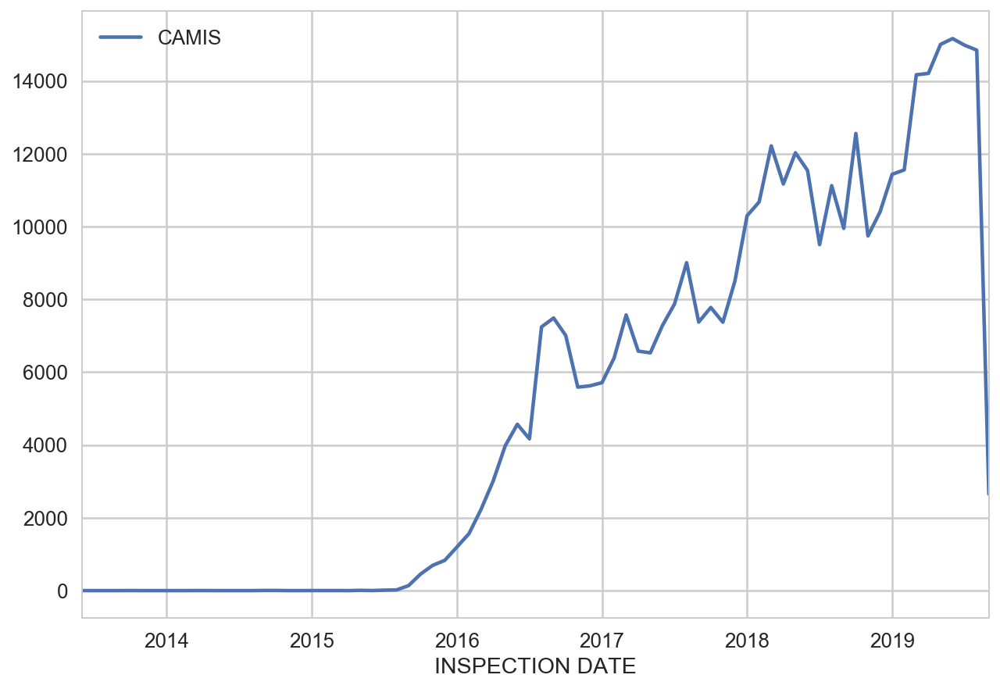

In [100]:
# Plot the total number of inspections, over 1-month periods
pivot.resample('1M').sum().plot()

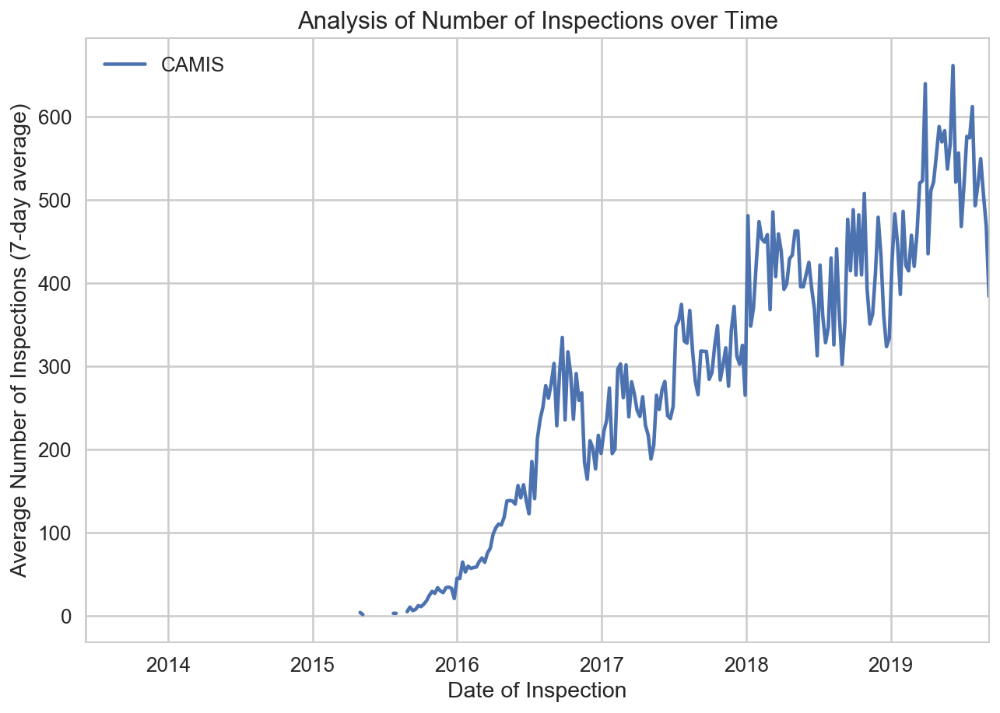

In [102]:
plot = pivot.resample('7D').mean().plot()
plot.set_xlabel("Date of Inspection")
plot.set_ylabel("Average Number of Inspections (7-day average)")
plot.set_title("Analysis of Number of Inspections over Time");

#### Pivot Table with two (or more) variables)

We would like to break down the results by borough, so we add the `column` parameter.

In [111]:
pivot2 = pd.pivot_table(
    data = restaurants, #
    index = 'INSPECTION DATE', 
    columns = 'BORO', 
    values = 'CAMIS', 
    aggfunc = 'count'
)
pivot2.head(10)

BORO,0,Bronx,Brooklyn,Manhattan,Queens,Staten Island
INSPECTION DATE,,,,,,
1900-01-01,2.0,95.0,325.0,546.0,235.0,43.0
2013-06-07,NaN,NaN,NaN,1.0,NaN,NaN
2013-10-22,NaN,NaN,2.0,NaN,NaN,NaN
2014-03-06,NaN,NaN,1.0,NaN,NaN,NaN
2014-04-21,NaN,NaN,2.0,NaN,NaN,NaN
2014-09-13,NaN,NaN,4.0,NaN,NaN,NaN
2014-10-30,NaN,NaN,5.0,NaN,NaN,NaN
2015-01-05,NaN,NaN,NaN,2.0,NaN,NaN
2015-02-11,NaN,NaN,2.0,NaN,NaN,NaN


##### Deleting rows and columns

Now, you will notice that there are a few columns and rows that are just noise. The first row with date *'1900-01-01'* is clearly noise. We can use the `drop` command of Pandas to drop these.

In [112]:
# The axis='index' (or axis=0) means that we delete a row with that index value
pivot2 = pivot2.drop(pd.to_datetime('1900-01-01'), axis='index') 

In [113]:
pivot2.tail(5)

BORO,0,Bronx,Brooklyn,Manhattan,Queens,Staten Island
INSPECTION DATE,,,,,,
2019-09-02,NaN,1.0,2.0,NaN,NaN,NaN
2019-09-03,NaN,57.0,147.0,344.0,192.0,NaN
2019-09-04,NaN,60.0,228.0,223.0,191.0,32.0
2019-09-05,NaN,99.0,120.0,289.0,234.0,46.0
2019-09-06,NaN,48.0,68.0,140.0,122.0,6.0


In [114]:
# We resample the index, to keep only dates every one month
# For that one month period, we compute the average value
pivot2.resample('1M').mean().tail(10)

BORO,0,Bronx,Brooklyn,Manhattan,Queens,Staten Island
INSPECTION DATE,,,,,,
2018-12-31,NaN,38.041667,104.800000,182.285714,108.038462,14.437500
2019-01-31,4.0,38.833333,117.000000,191.652174,110.500000,14.550000
2019-02-28,NaN,49.619048,120.913043,189.708333,111.250000,28.222222
2019-03-31,NaN,58.384615,131.074074,205.240000,130.185185,20.173913
2019-04-30,2.0,50.320000,139.807692,209.884615,131.692308,22.526316
2019-05-31,4.0,53.884615,153.307692,213.461538,143.653846,16.250000
2019-06-30,2.0,53.360000,142.464286,231.538462,114.250000,29.380952
2019-07-31,NaN,68.333333,155.461538,225.640000,133.384615,19.650000
2019-08-31,NaN,58.625000,134.571429,211.074074,131.259259,21.250000


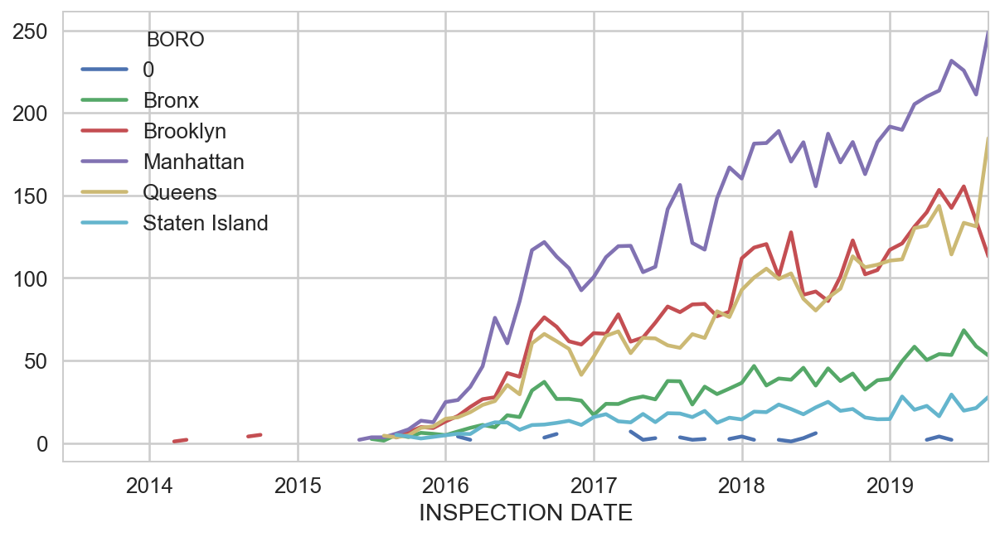

In [115]:
# If we plot a dataframe then by default the index column
# in our case the INSPECTION DATE becomes the x-asis
# and all the columns become separate lines in the plot
pivot2.resample('1M').mean().plot(figsize=(10,5))

# Potential Exercise, if we have time: 
# Drop the last date, which corresponds to an incomplete month

### (Optional, FYI) Advanced Pivot Tables

We can also add multiple attributes in the index and columns. It is also possible to have multiple aggregation functions, and we can even define our own aggregation functions.

In [116]:
# We write a function that returns the 
# number of unique items in a list x 
def count_unique(x):
    return len(set(x))

# We break down by BORO and GRADE, and also calculate 
# inspections in unique (unique restaurants) 
# and non-unique entries (effectuvely, violations)
pivot_advanced = pd.pivot_table(
    data = restaurants, #
    index = 'GRADE DATE', 
    columns = ['BORO', 'GRADE'],
    values = 'CAMIS', 
    aggfunc = ['count', count_unique]
)

# Take the total number of inspections (unique and non-unique)
agg = pivot_advanced.resample('1M').sum()

# Show the last 5 entries and show the transpose (.T) 
agg.tail().T

GRADE DATE                        2019-05-31  2019-06-30  2019-07-31  \
             BORO          GRADE                                       
count        0             A             4.0         2.0         0.0   
                           B             0.0         0.0         0.0   
                           C             0.0         0.0         0.0   
             Bronx         A           542.0       510.0       349.0   
                           B           109.0       157.0        90.0   
                           C            37.0        43.0        55.0   
             Brooklyn      A          1676.0      1588.0      1179.0   
                           B           276.0       299.0       252.0   
                           C           122.0        85.0        66.0   
             Manhattan     A          2551.0      2273.0      1694.0   
                           B           343.0       414.0       308.0   
                           C           174.0       298.0       139.0   
             Queens        A          1691.0      1278.0       933.0   
                           B           222.0       326.0       166.0   
                           C            73.0       111.0        61.0   
             Staten Island A           166.0       254.0       130.0   
                           B            14.0        30.0        20.0   
                           C             3.0        12.0         3.0   
count_unique 0             A             2.0         1.0         0.0   
                           B             0.0         0.0         0.0   
                           C             0.0         0.0         0.0   
             Bronx         A           249.0       230.0       161.0   
                           B            30.0        44.0        23.0   
                           C             5.0         6.0        10.0   
             Brooklyn      A           734.0       720.0       536.0   
                           B            71.0        77.0        64.0   
                           C            23.0        15.0        12.0   
             Manhattan     A          1201.0      1034.0       777.0   
                           B            93.0       105.0        75.0   
                           C            31.0        52.0        26.0   
             Queens        A           769.0       586.0       421.0   
                           B            62.0        84.0        43.0   
                           C            14.0        20.0        11.0   
             Staten Island A            75.0       126.0        59.0   
                           B             3.0         9.0         5.0   
                           C             2.0         2.0         1.0   

GRADE DATE                        2019-08-31  2019-09-30  
             BORO          GRADE                          
count        0             A             0.0         0.0  
                           B             0.0         0.0  
                           C             0.0         0.0  
             Bronx         A           423.0        60.0  
                           B            25.0         0.0  
                           C            14.0         0.0  
             Brooklyn      A          1112.0       152.0  
                           B            70.0         0.0  
                           C            21.0         0.0  
             Manhattan     A          1805.0       360.0  
                           B            79.0         0.0  
                           C            29.0         0.0  
             Queens        A           987.0       153.0  
                           B            47.0         0.0  
                           C            49.0         0.0  
             Staten Island A           175.0        26.0  
                           B             8.0         0.0  
                           C             4.0         0.0  
count_unique 0             A             0.0         0.0  
                        

### Exercise 1 

Now let's do the same exercise, but instead of counting the number of inspections, we want to compute the average score assigned by the inspectors. Hint: We will need to change the `values` and the `aggfunc` parameters in the `pivot_table` function above.

In [117]:
pivot = pd.pivot_table(
    data = restaurants, 
    index = 'INSPECTION DATE', # specifies the rows
    values = 'SCORE',  # specifies the content of the cells
    aggfunc = 'mean' # compute the average SCORE
)

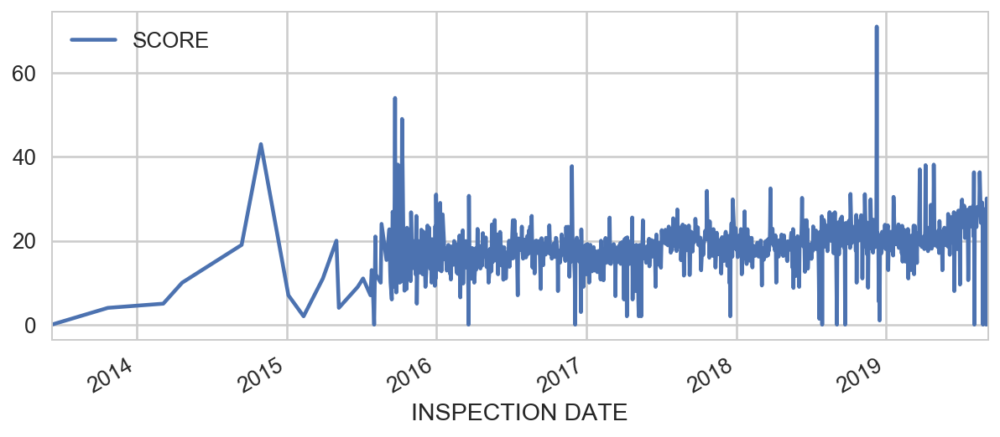

In [118]:
pivot.plot(figsize=(10,4))

In [119]:
pivot.resample('1M').mean().tail(10)

,SCORE
INSPECTION DATE,
2018-12-31,21.046980
2019-01-31,20.537412
2019-02-28,19.500450
2019-03-31,20.236672
2019-04-30,21.887201
2019-05-31,20.080670
2019-06-30,21.682988
2019-07-31,24.979920
2019-08-31,25.077607




### Exercise 2

We now want to examine if different cuisines have different inspection scores. Compute the average inspection score by cuisine. Use the `sort_values()` command ([documentation](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.sort_values.html)) to order cuisines by their inspection scores.

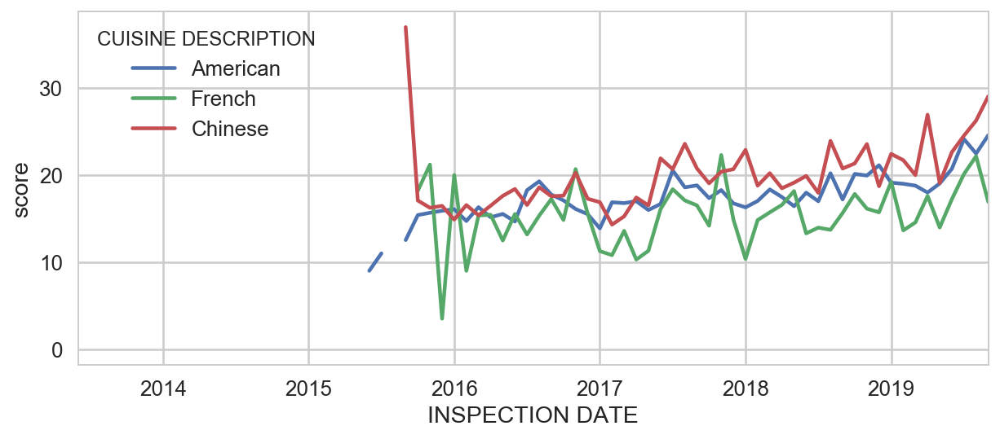

In [121]:
pivot = pd.pivot_table(
    data = restaurants, 
    index = 'INSPECTION DATE', # dates are the rows
    columns = 'CUISINE DESCRIPTION', # cuisines are the columns
    values = 'SCORE',  # we analyze the SCORE
    aggfunc = 'mean' # compute the average SCORE
)
# Select 3 columns (american, frenchn, chinese), compute the average score for a month
# and plot the results
pivot[ ["American", "French", "Chinese"] ].resample('1M').mean().plot(figsize=(10,4))
plt.ylabel("score");

## Exercise: NYPD Vehicle Collisions

* We interacted with the NYC Restaurant Inspection Data. Now, let's download another dataset, and do some analysis. We will focus on the [NYPD Vehicle Collisions](https://data.cityofnewyork.us/Public-Safety/NYPD-Motor-Vehicle-Collisions/h9gi-nx95/data) data set.


### Task 1: 

Download the dataset. Use the "Export" view, get the URL for the CSV file, and dowload it using curl. (See the top of the notebook for guidance.) 


In [39]:
!curl 'https://data.cityofnewyork.us/api/views/h9gi-nx95/rows.csv?accessType=DOWNLOAD' -o data/accidents.csv

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  330M    0  330M    0     0  1511k      0 --:--:--  0:03:43 --:--:-- 2005k0 --:--:--  0:00:04 --:--:--  521k36 --:--:-- 1232k-:--:--  0:00:46 --:--:-- 1208kM    0     0  1135k      0 --:--:--  0:01:05 --:--:-- 1289k2k      0 --:--:--  0:01:17 --:--:-- 1503k 0     0  1199k      0 --:--:--  0:01:37 --:--:-- 1615k    0 --:--:--  0:01:41 --:--:-- 1258k0  1386k      0 --:--:--  0:02:51 --:--:-- 1877k  0     0  1507k      0 --:--:--  0:03:40 --:--:-- 1947k


In [21]:
df = pd.read_csv("data/accidents.csv", low_memory=False)

In [22]:
len(df)

1558237

In [23]:
df.head()

,DATE,TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,UNIQUE ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,08/24/2019,11:53,NaN,NaN,NaN,NaN,NaN,CROSS BRONX EXPY RAMP,NaN,NaN,...,Aggressive Driving/Road Rage,NaN,NaN,NaN,4194003,Sedan,Sedan,NaN,NaN,NaN
1,08/24/2019,13:22,NaN,NaN,NaN,NaN,NaN,VERRAZANO BRIDGE LOWER,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4194562,Station Wagon/Sport Utility Vehicle,Sedan,NaN,NaN,NaN
2,08/24/2019,23:00,NaN,NaN,NaN,NaN,NaN,MEEKER AVENUE,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4194211,Sedan,Motorcycle,NaN,NaN,NaN
3,08/24/2019,23:50,NaN,NaN,NaN,NaN,NaN,MERIDIAN RD,NEW YORK AVE,NaN,...,NaN,NaN,NaN,NaN,4193896,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN
4,08/23/2019,0:12,NaN,NaN,40.825134,-73.95141,POINT (-73.95141 40.825134),BROADWAY,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4193507,Pick-up Truck,Sedan,NaN,NaN,NaN



### Task 2: 

Find out the most common contributing factors to the collisions. 
 

In [24]:
df['CONTRIBUTING FACTOR VEHICLE 1'].value_counts().head(11)

Unspecified                       579279
Driver Inattention/Distraction    286053
Failure to Yield Right-of-Way      88020
Following Too Closely              75546
Backing Unsafely                   59362
Other Vehicular                    49670
Fatigued/Drowsy                    46813
Turning Improperly                 40040
Passing or Lane Usage Improper     35617
Passing Too Closely                32586
Unsafe Lane Changing               29135
Name: CONTRIBUTING FACTOR VEHICLE 1, dtype: int64

Now let's plot a histogram of the above list. Note that we skip the first element.

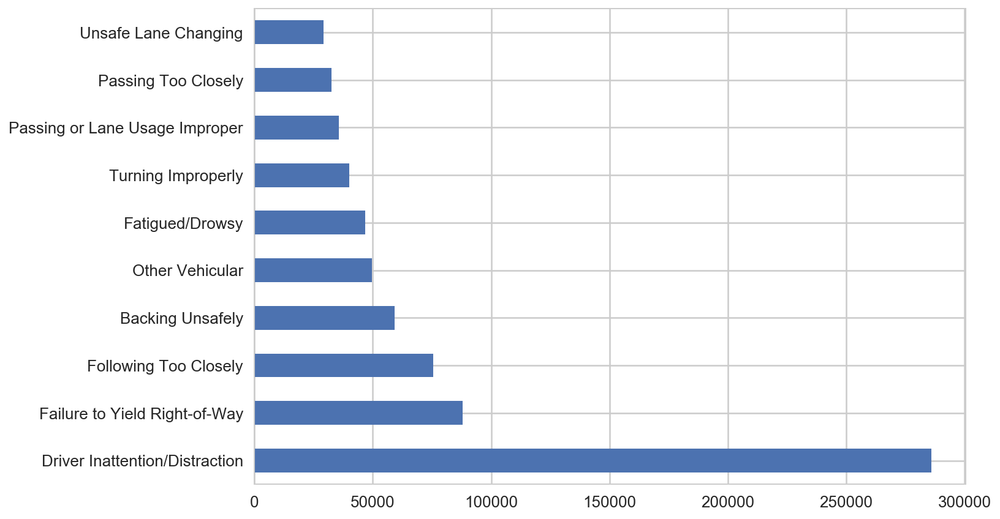

In [25]:
df['CONTRIBUTING FACTOR VEHICLE 1'].value_counts()[1:11].plot(kind='barh')

### Task 3: 

Break down the number of collisions by borough.





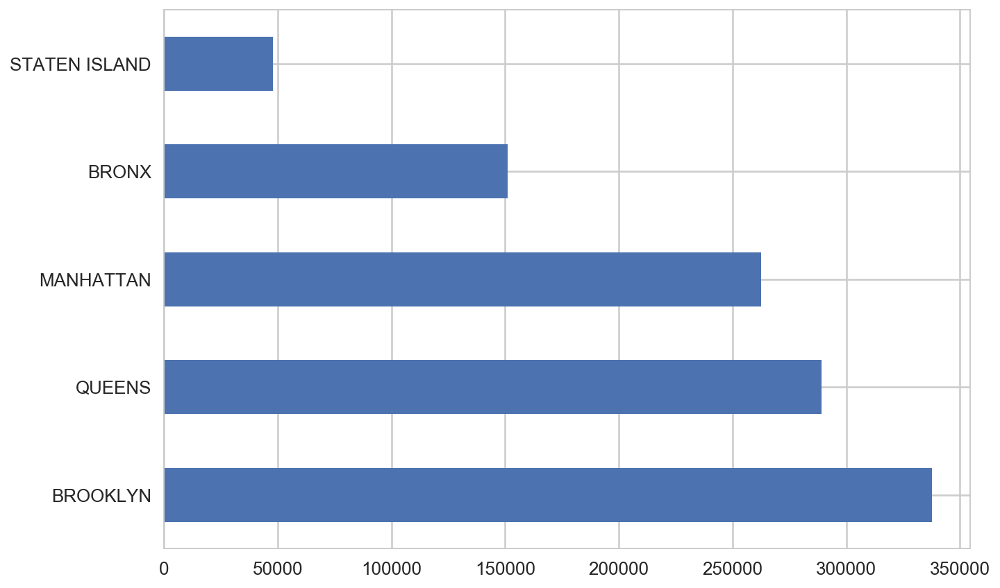

In [26]:
df.BOROUGH.value_counts().plot(kind='barh')

### Task 4

Find out the how many collisions had 0 persons injured, 1 persons injured, etc. persons injured in each accident. Use the `value_counts()` approach. You may also find the `.plot(logy=True)` option useful when you create the plot to make the y-axis logarigthmic.
 

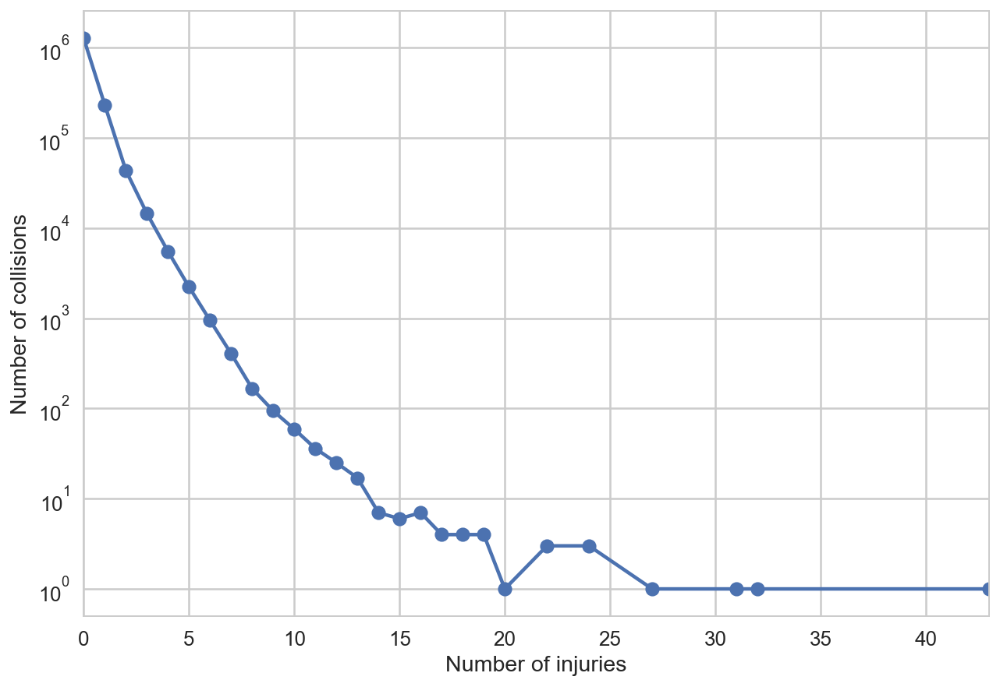

In [27]:
plot = (
    df['NUMBER OF PERSONS INJURED'] # take the num of injuries column
    .value_counts() # compure the freuquency of each value
    .sort_index() # sort the results based on the index value instead of the frequency, 
                  # which is the default for value_counts
    .plot( # and plot the results
        kind='line', # we use a line plot because the x-axis is numeric/continuous
        marker='o',  # we use a marker to mark where we have data points 
        logy=True # make the y-axis logarithmic
    )
)
plot.set_xlabel("Number of injuries")
plot.set_ylabel("Number of collisions");

### Task 5

Break down the accidents by borough and contributing factor. Use the `pivot_table` function of Pandas
 

In [28]:
pivot = pd.pivot_table(
    data = df,
    index = 'CONTRIBUTING FACTOR VEHICLE 1',
    columns = 'BOROUGH',
    aggfunc = 'count',
    values = 'UNIQUE ID'
)
pivot

BOROUGH,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
CONTRIBUTING FACTOR VEHICLE 1,,,,,
1,NaN,3.0,1.0,2.0,2.0
80,12.0,19.0,9.0,29.0,1.0
Accelerator Defective,91.0,176.0,91.0,149.0,37.0
Aggressive Driving/Road Rage,762.0,1230.0,1003.0,905.0,154.0
Alcohol Involvement,1662.0,3191.0,1654.0,3185.0,590.0
Animals Action,91.0,155.0,63.0,199.0,166.0
Backing Unsafely,6632.0,13777.0,9428.0,14605.0,2115.0
Brakes Defective,589.0,1020.0,558.0,776.0,219.0
Cell Phone (hand-Held),46.0,56.0,32.0,39.0,10.0


### Task 6

Find the dates with the most accidents. Can you figure out what happened on these days? 


In [29]:
df.DATE.value_counts()

01/21/2014    1161
11/15/2018    1064
12/15/2017     999
05/19/2017     974
01/18/2015     961
02/03/2014     960
03/06/2015     939
05/18/2017     911
01/07/2017     896
03/02/2018     884
12/14/2017     883
09/30/2016     872
11/26/2013     867
11/09/2018     865
04/28/2017     857
03/08/2013     851
10/21/2016     851
06/29/2018     845
06/22/2017     845
12/14/2018     841
03/16/2017     839
06/14/2018     833
10/30/2017     832
10/27/2016     831
03/05/2015     830
10/12/2018     829
06/13/2017     829
09/15/2017     827
10/20/2017     823
09/06/2018     821
              ... 
01/13/2013     373
09/03/2012     373
01/06/2019     372
10/30/2012     372
01/13/2019     371
05/29/2017     371
12/25/2016     365
02/01/2015     361
01/20/2014     360
07/04/2014     360
10/31/2015     357
01/21/2013     355
12/25/2012     354
12/28/2014     349
11/02/2012     345
11/04/2012     344
03/02/2014     344
01/11/2015     341
12/25/2017     333
12/25/2018     329
12/25/2015     321
01/05/2014  

### Task 7

Plot the number of accidents per day. (Hint: Ensure that your date column is in the right datatype and that it is properly sorted, before plotting)


In [30]:
df.DATE = pd.to_datetime(df.DATE, format="%m/%d/%Y")

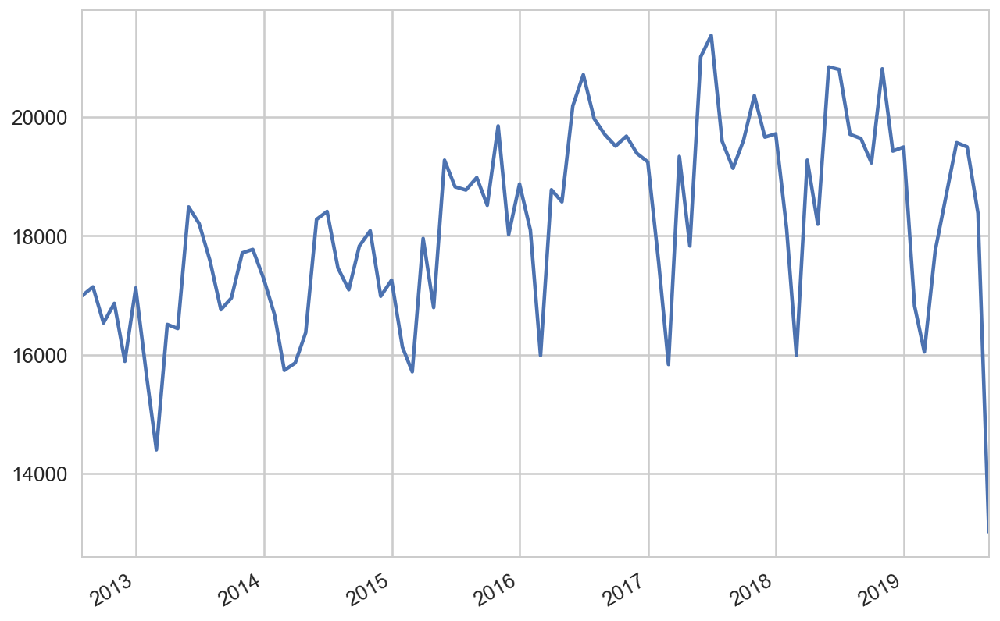

In [35]:
(
    df.DATE.value_counts() # count the number of accidents per day
    .sort_index() # sort the dates
    .resample('1M') # take periods of 1 month
    .sum() # sum the number of accidents per month
    .drop(pd.to_datetime('2019-04-30'), axis='index') # drop the current month
    .plot() # plot the result
);

### Task 8

Plot the accidents in map. Use a scatter plot using the `plot(kind='scatter', x=..., y=....)` command, and use the `LATITUDE` and `LONGITUDE` parameters. (Hint: **You will have to remove bad data points before getting into the right visual result**. To do this, specify a selection condition to limit the lat/long values to be values that are proper for the NYC region.)

/Applications/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


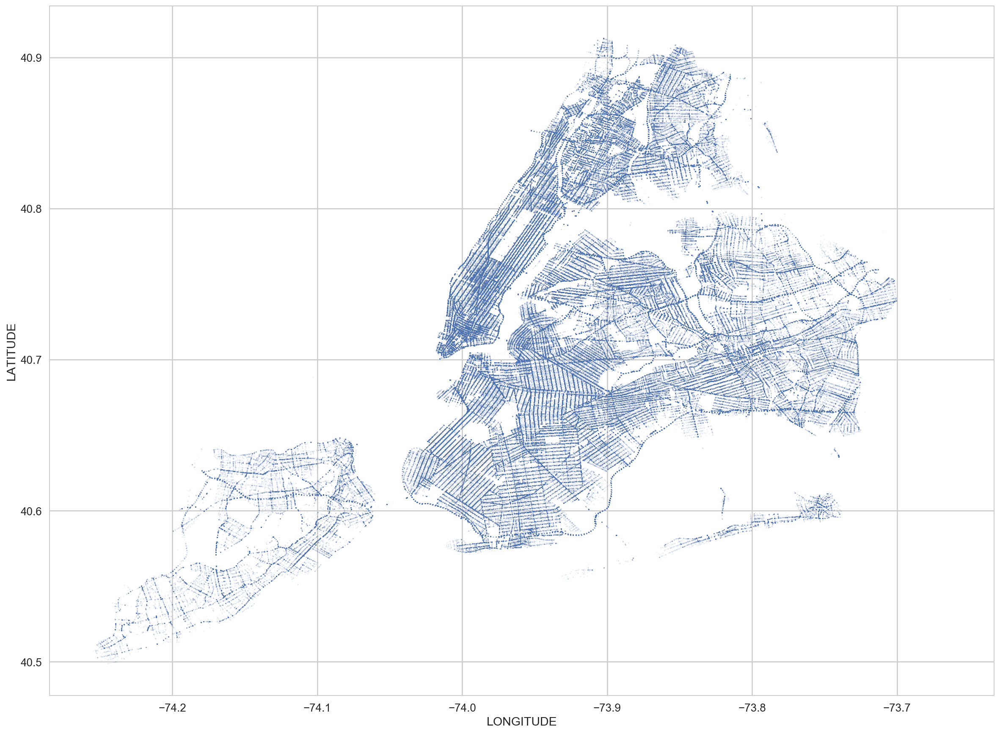

In [39]:
cleandf = df[(df.LONGITUDE<-50) & (df.LONGITUDE>-74.5) & (df.LATITUDE< 41)]

cleandf[ (df.LATITUDE>40) & (df.LATITUDE<41) & (df.LONGITUDE> -74.6) & (df.LONGITUDE<-50) ].plot(
    figsize = (20,15),
    kind = 'scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    s = 1, # make each dot to be very small 
    alpha = 0.05 # makes each point 95% transparent
)

# df[ (df.LATITUDE>40) & (df.LATITUDE<41) & (df.LONGITUDE> -74.6) & (df.LONGITUDE<-50)
#     & (df["NUMBER OF PERSONS KILLED"]>0)
#   ].plot(
#     kind = 'scatter',
#     x = 'LONGITUDE',
#     y = 'LATITUDE', figsize = (20,15), color = 'red', marker = 'x', s=3,
#     ax = base
# )

### Task 9

Plot the accidents in map as above, but limit the data only to accidents with at least one injury.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


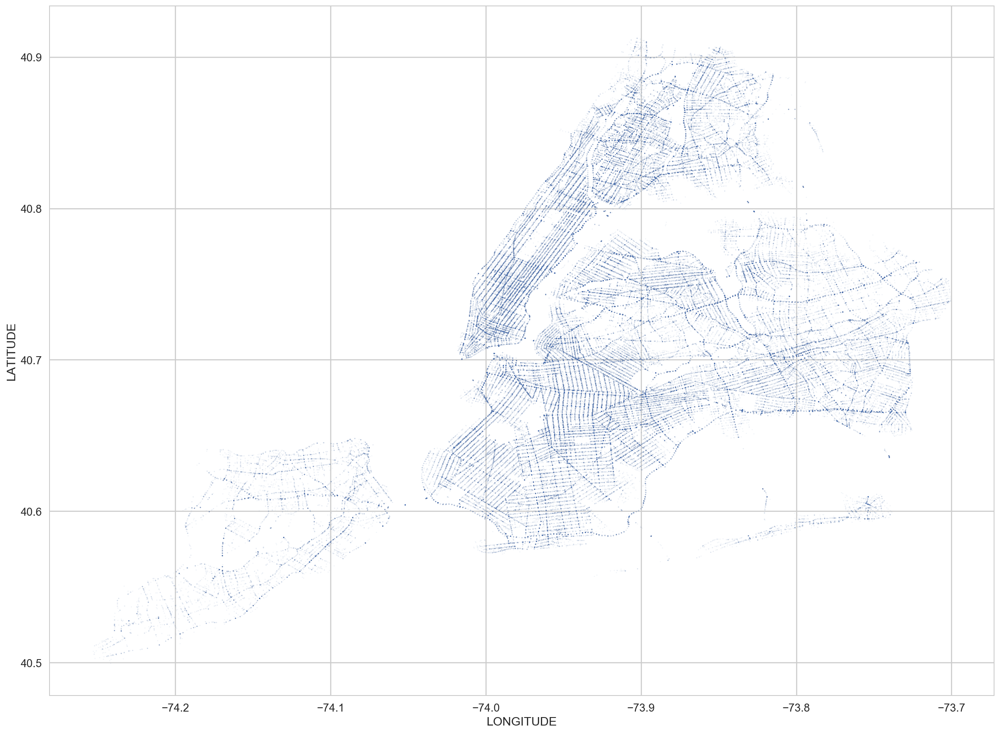

In [40]:
mask_injured = cleandf['NUMBER OF PERSONS INJURED']>=1
injured_df = cleandf[mask_injured]

injured_df.plot(
    kind = 'scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    s = 1, # make the size of the marker 1 pixel
    figsize = (20,15), # increase the size of the figure
    alpha = 0.05 # make each dot to be 95% transparent 
)

### Creating 2d histograms, density plots, and contour plots
In the picture above, we can visually see that Manhattan, especially eastern midtown, and the area downtown near the entrance to the bridges, has a higher density. We can also derive histograms and density plots on 2-dimensions.

#### Hexagonal bin plot
The hexbin plot created a 2-d histogram, where the color signals the number of points within a particular area. The `gridsize` parameter chooses the size of each bin. Higher values offer higher granularity, but very high values tend to create sparsity, when we do not have enough data points.

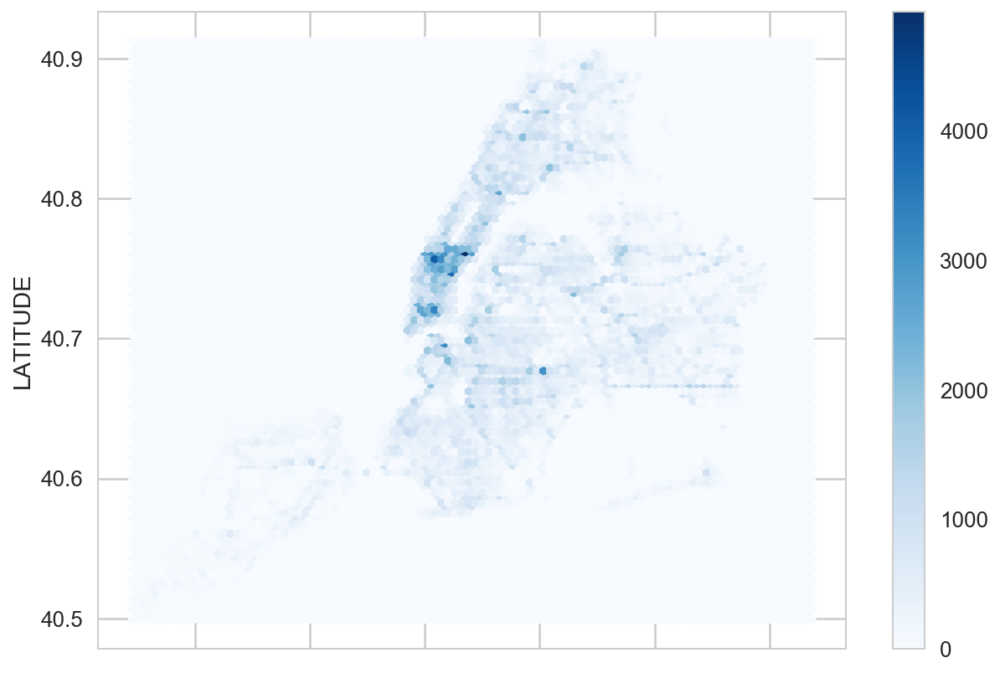

In [43]:
# Hexbin plot
cleandf.plot(
    kind='hexbin',
    x='LONGITUDE',
    y='LATITUDE',
    gridsize=100,
    cmap=plt.cm.Blues,
    figsize=(10, 7))

#### 2d density  and contour plots
An alternative to the hexbin plots is to use density plots in two dimensions.

/Applications/anaconda/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


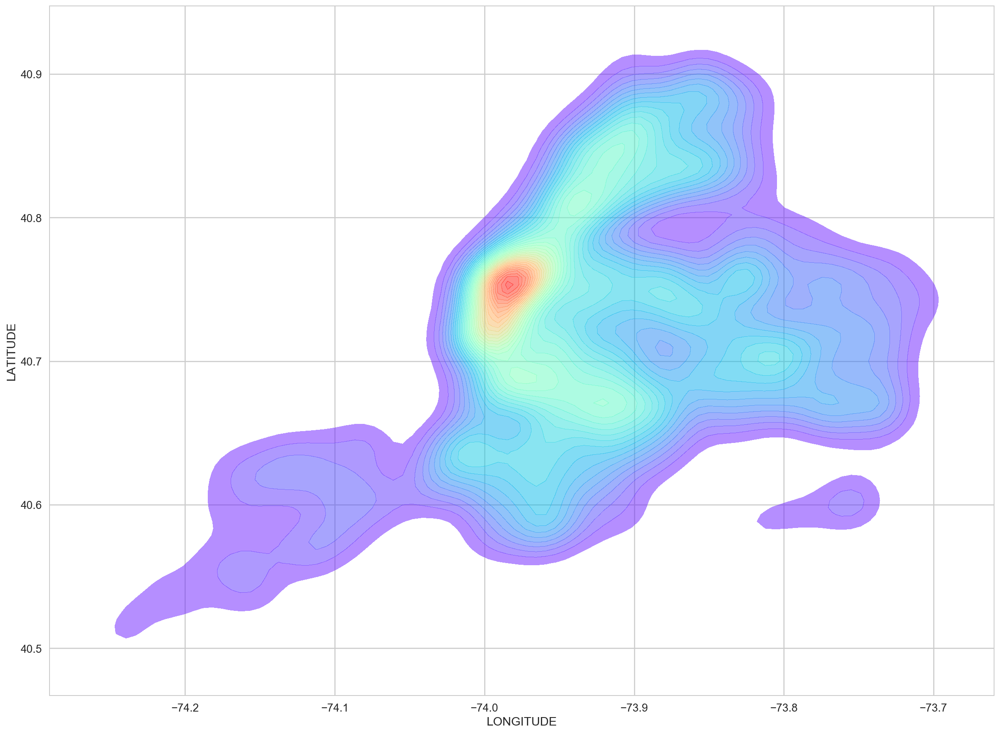

In [44]:
# Basic 2D density plot
plt.subplots(figsize=(20, 15))

# We take a sample, because density plots take a long time to compute
# and a sample is typically as good as the full dataset
sample = cleandf.sample(10000)

sns.kdeplot(
    sample.LONGITUDE,
    sample.LATITUDE,
    gridsize=100,  # controls the resolution
    cmap=plt.cm.rainbow,  # color scheme
    shade= True, # whether to have a density plot (True), or just the contours (False)
    alpha=0.5,
    shade_lowest=False,
    n_levels=50  # How many contours/levels to have
)

/Applications/anaconda/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


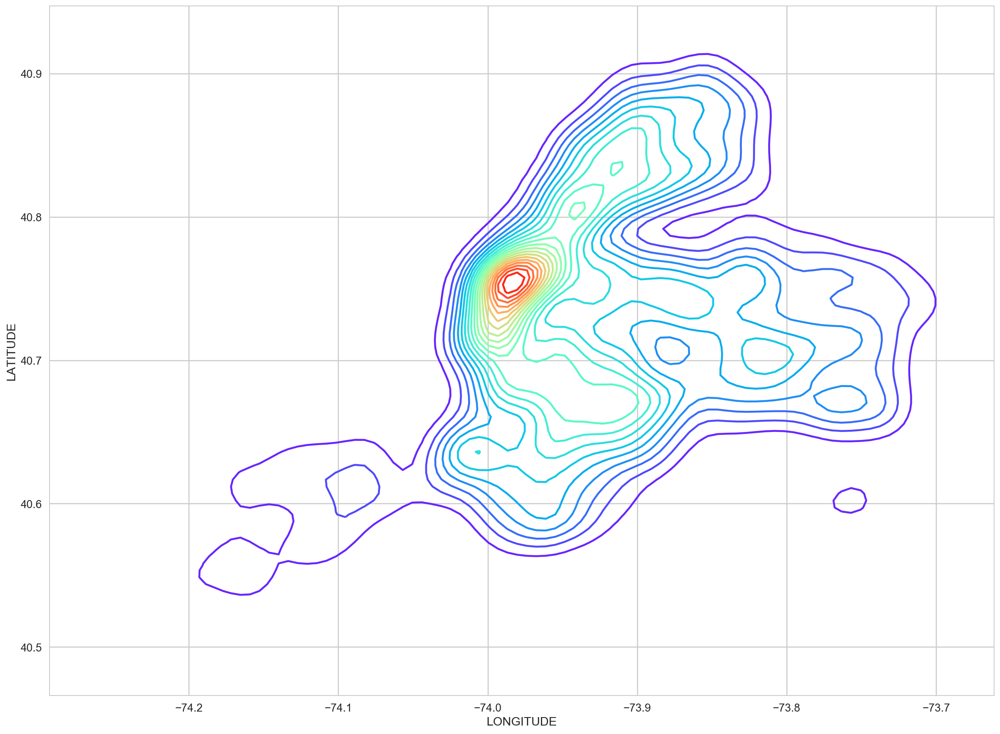

In [45]:
# Basic 2D contour plot
plt.subplots(figsize=(20, 15))

# We take a sample, because density plots take a long time to compute
# and a sample is typically as good as the full dataset
sample = cleandf.sample(10000)

sns.kdeplot(
    sample.LONGITUDE,
    sample.LATITUDE,
    gridsize=100,
    cmap=plt.cm.rainbow,
    shade=False,
    shade_lowest=False,
    n_levels=25)

### Combining plots
So far, we examined how to create individual plots. We can even combine multiple plots together, using the ax parameter. So, let's say that we want to combine the scatter plots with the contour plot above:

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
/Applications/anaconda/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


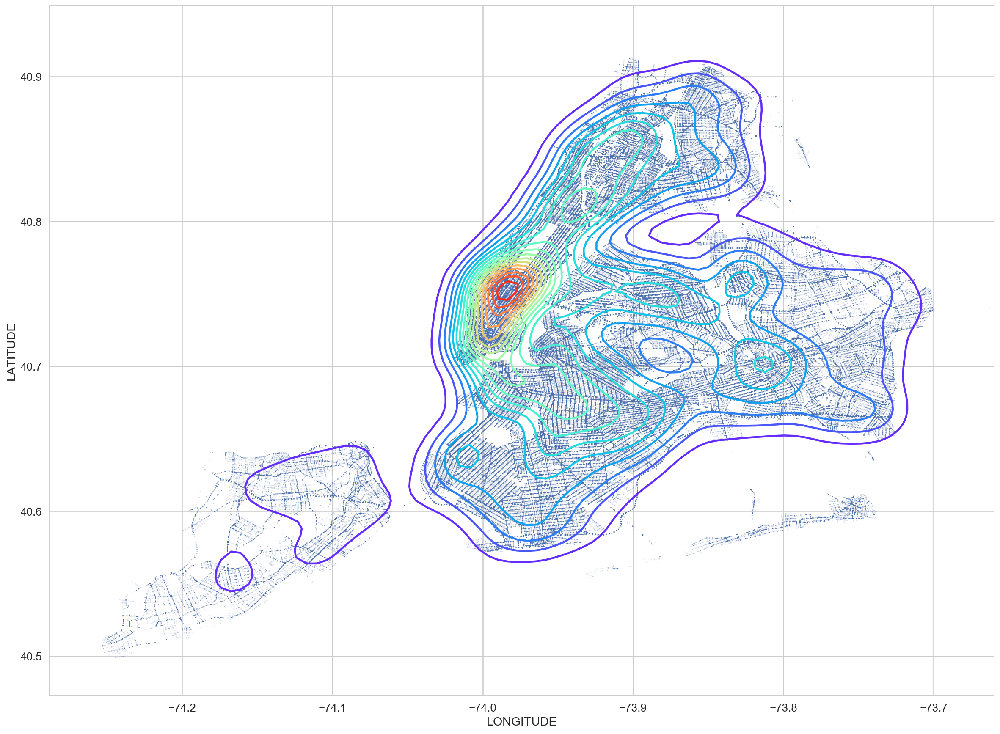

In [46]:
sample = cleandf.sample(10000)

scatterplot = cleandf.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(20, 15),
    s=0.5,
    alpha=0.1)

sns.kdeplot(
    sample.LONGITUDE,
    sample.LATITUDE,
    gridsize=100,
    cmap=plt.cm.rainbow,
    shade=False,
    shade_lowest=False,
    n_levels=20,
    alpha=1,
    ax=scatterplot)

### Bonus plots

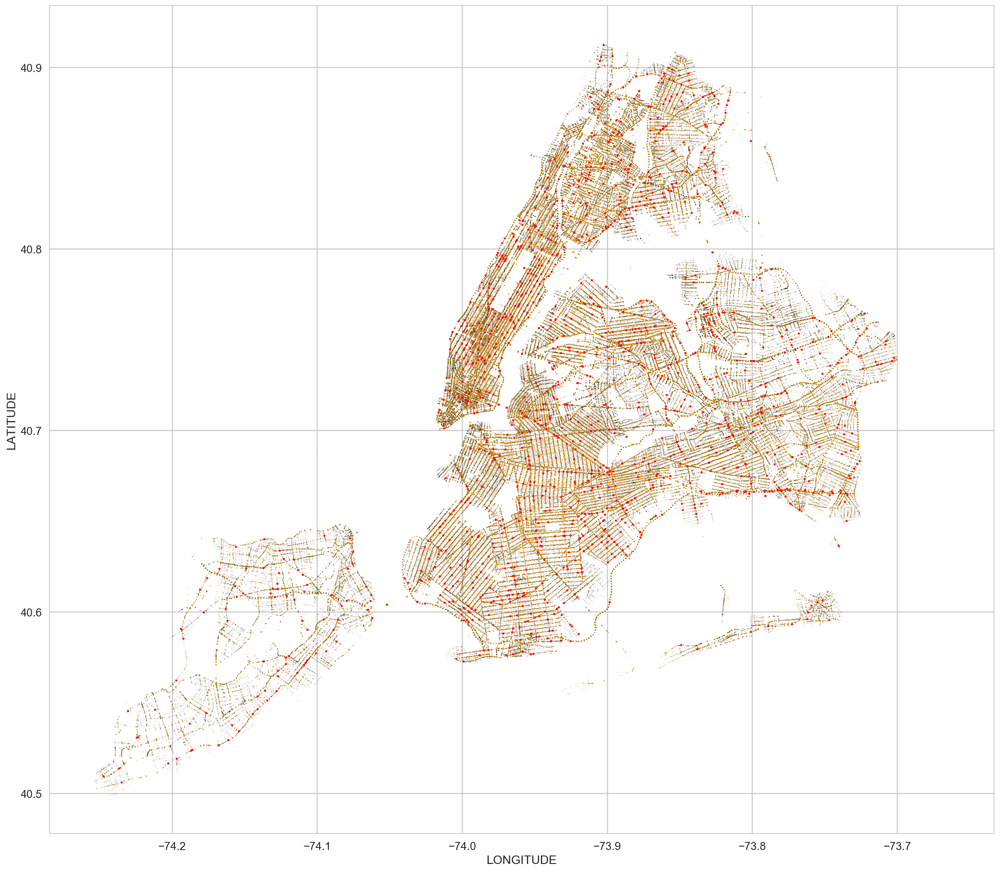

In [89]:
# In the code below, we create three plots
# One with  all the accidents (in black)
# One with all accidents that resulted in an injury (with orange)
# One with all the accidents with deaths (with red dots) 
# Then wen combine the  plots using the "ax" parameter

df = pd.read_csv("data/accidents.csv", low_memory=False)

# We put conditions to keep only rows that 
# have reasonable values for LONGITUDE and LATITUDE
# The & character is the "AND" in Pandas
# the df.LATITUDE is equivalent to df['LATITUDE']
cleandf = df[ (df.LATITUDE > 40) & (df.LATITUDE < 41) & (df.LONGITUDE < -72) & (df.LONGITUDE > -74.5) ]


all_accidents_plot = cleandf.plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    color = 'black',
    alpha = 0.05, # makes the data points transparent (1 = opaque, 0 fully transparent)
    s = 0.5 # make the size of the market just 0.5 pixel
)

# We will keep only entries with at least one injury
# note that we cannot use the df.NUMBER OF PERSON INJURED notation
# because the attribute contains spaces.
mask_injured = cleandf['NUMBER OF PERSONS INJURED']>=1
injured_plot = cleandf[mask_injured].plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    alpha = 0.1, # makes the data points transparent (1 = opaque, 0 fully transparent)
    color = 'orange',
    ax = all_accidents_plot, # the ax parameter allows us to combine plots
    s = 1 # make the size of the market just 1 pixel
)

# we want only accidents with at least one death
mask_killed = cleandf['NUMBER OF PERSONS KILLED']>=1
cleandf[mask_killed].plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    alpha = 0.85, # makes the data points transparent (1 = opaque, 0 fully transparent)
    s = 5, # make the size of the market 5 pixels, to be more visible
    color = 'red',
    ax = injured_plot # the ax parameter allows us to combine plots
)

/Applications/anaconda/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


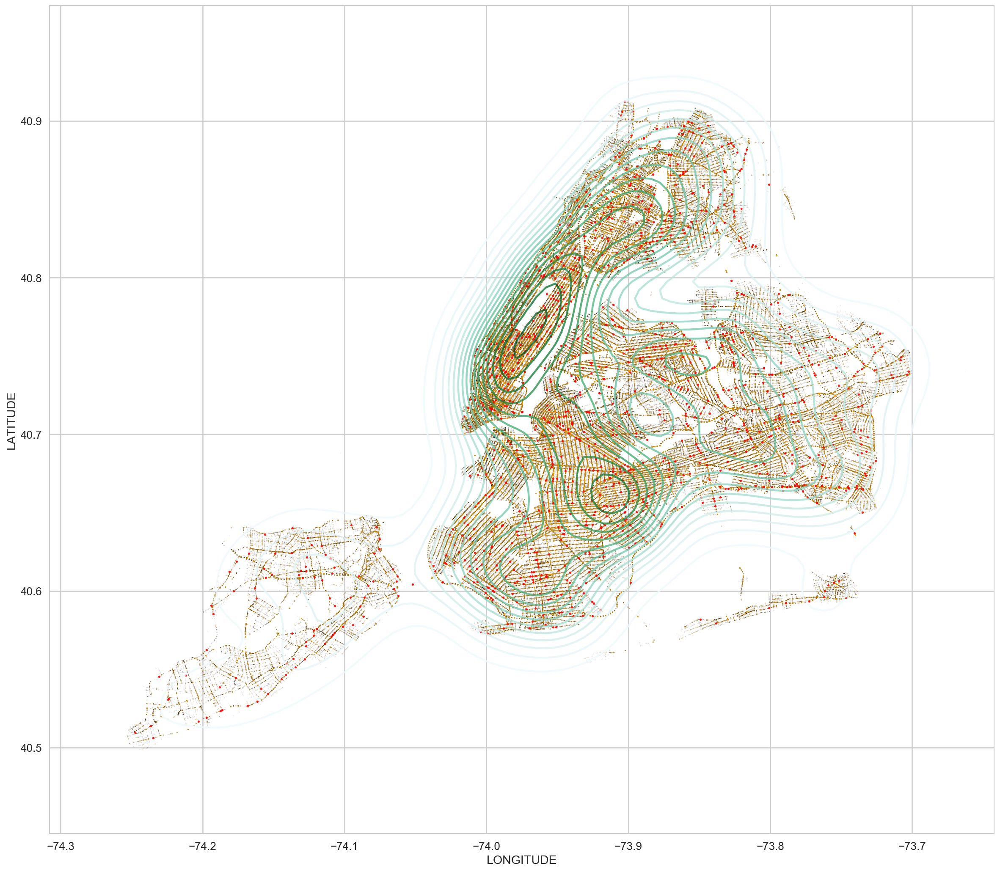

In [90]:
# Same as above, but with a 2-d density estimation for the location of
# accidents that resulted in at least one death

cleandf = df[ (df.LATITUDE > 40) & (df.LATITUDE < 41) & (df.LONGITUDE < -72) & (df.LONGITUDE > -74.5) ]


all_accidents_plot = cleandf.plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    color = 'black',
    alpha = 0.05, # makes the data points transparent (1 = opaque, 0 fully transparent)
    s = 0.5 # make the size of the market just 0.5 pixel
)

# We will keep only entries with at least one injury
# note that we cannot use the df.NUMBER OF PERSON INJURED notation
# because the attribute contains spaces.
mask_injured = cleandf['NUMBER OF PERSONS INJURED']>=1
injured_plot = cleandf[mask_injured].plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    alpha = 0.1, # makes the data points transparent (1 = opaque, 0 fully transparent)
    color = 'orange',
    ax = all_accidents_plot, # the ax parameter allows us to combine plots
    s = 1 # make the size of the market just 1 pixel
)

# we want only accidents with at least one death
mask_killed = cleandf['NUMBER OF PERSONS KILLED']>=1
killed_plot = cleandf[mask_killed].plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    alpha = 0.85, # makes the data points transparent (1 = opaque, 0 fully transparent)
    s = 5, # make the size of the market 5 pixels, to be more visible
    color = 'red',
    ax = injured_plot # the ax parameter allows us to combine plots
)

sns.set_style("white")
mask = cleandf['NUMBER OF PERSONS KILLED']>=1
sample = cleandf[mask] # .sample(10000)

sns.kdeplot(sample.LONGITUDE, sample.LATITUDE, gridsize=100,
            cmap=plt.cm.BuGn, shade=False, shade_lowest=True, n_levels=20, alpha=0.75, ax = killed_plot)
